In [1]:
import os
print(os.listdir("../input/animefacedataset"))

['images']


**Importing the libraries**

In [2]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

## Some dogs

> The Stanford Dogs dataset contains images of 120 breeds of dogs from around the world.

There are 63565 pictures of anime characters.


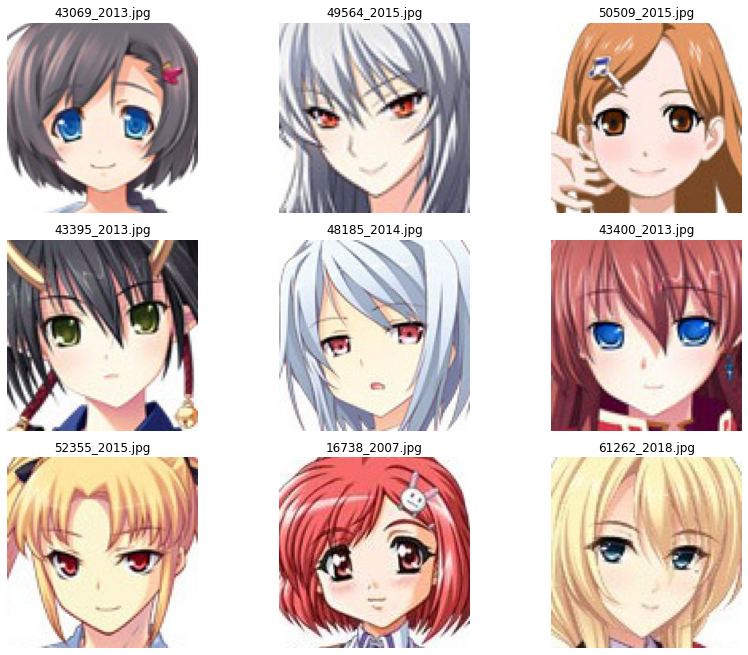

In [3]:
PATH = '../input/animefacedataset/images/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} pictures of anime characters.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Image Preprocessing

In [4]:
batch_size = 64
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('../input/animefacedataset/', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

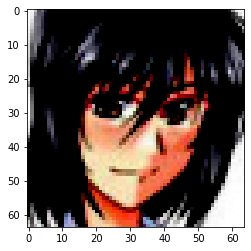

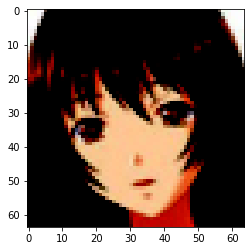

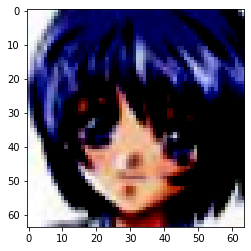

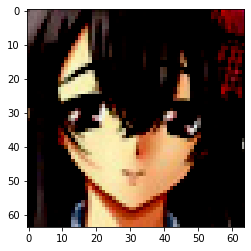

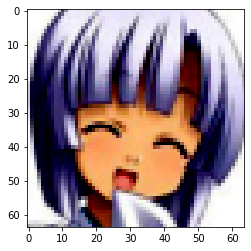

In [5]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

# Weights
### Defining the weights_init function

In [6]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

## setup

In [7]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

In [8]:
batch_size = 64
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 120

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [9]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [10]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [11]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

### Training Loop

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/994 [00:00<?, ?it/s]

[1/120][497/994] Loss_D: 1.1364 Loss_G: 1.5701 D(x): 0.5791 D(G(z)): 0.4104 / 0.1930
[1/120][994/994] Loss_D: 1.3964 Loss_G: 1.2086 D(x): 0.4496 D(G(z)): 0.4346 / 0.2802


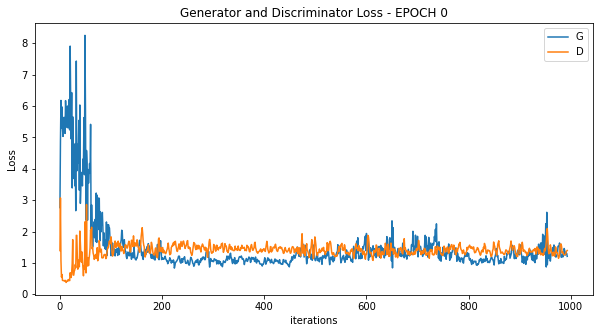

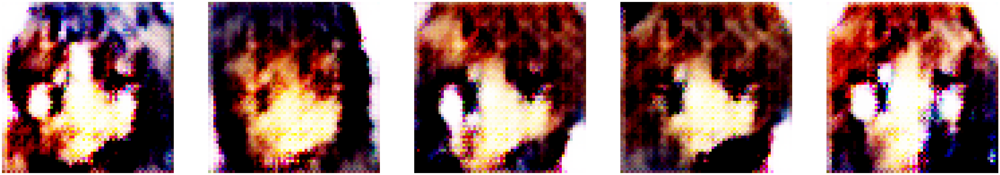

  0%|          | 0/994 [00:00<?, ?it/s]

[2/120][497/994] Loss_D: 1.1398 Loss_G: 1.5630 D(x): 0.5374 D(G(z)): 0.3597 / 0.1948
[2/120][994/994] Loss_D: 1.2118 Loss_G: 1.6073 D(x): 0.5096 D(G(z)): 0.3808 / 0.1820


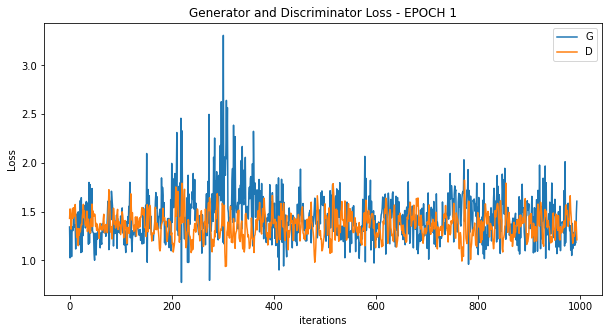

  0%|          | 0/994 [00:00<?, ?it/s]

[3/120][497/994] Loss_D: 1.3425 Loss_G: 1.6943 D(x): 0.5579 D(G(z)): 0.4985 / 0.1684
[3/120][994/994] Loss_D: 1.3016 Loss_G: 1.5326 D(x): 0.4388 D(G(z)): 0.3530 / 0.1929


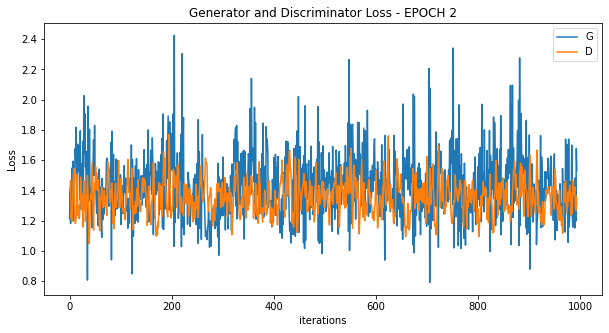

  0%|          | 0/994 [00:00<?, ?it/s]

[4/120][497/994] Loss_D: 1.3201 Loss_G: 1.4164 D(x): 0.4819 D(G(z)): 0.4256 / 0.2223
[4/120][994/994] Loss_D: 1.3922 Loss_G: 1.2498 D(x): 0.3927 D(G(z)): 0.3627 / 0.2685


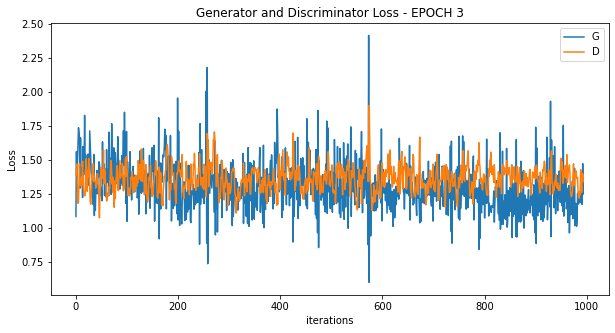

  0%|          | 0/994 [00:00<?, ?it/s]

[5/120][497/994] Loss_D: 1.3370 Loss_G: 1.1032 D(x): 0.4191 D(G(z)): 0.3677 / 0.3161
[5/120][994/994] Loss_D: 1.3541 Loss_G: 1.6829 D(x): 0.4940 D(G(z)): 0.4520 / 0.1701


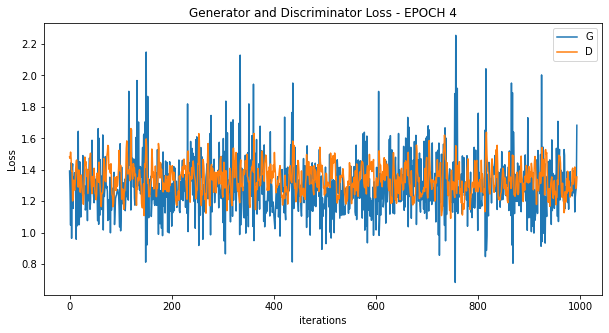

  0%|          | 0/994 [00:00<?, ?it/s]

[6/120][497/994] Loss_D: 1.1404 Loss_G: 1.4376 D(x): 0.5192 D(G(z)): 0.3464 / 0.2173
[6/120][994/994] Loss_D: 1.4409 Loss_G: 1.3760 D(x): 0.4484 D(G(z)): 0.4392 / 0.2280


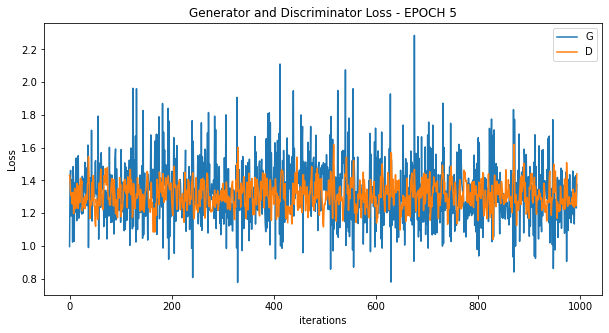

  0%|          | 0/994 [00:00<?, ?it/s]

[7/120][497/994] Loss_D: 1.3530 Loss_G: 1.7682 D(x): 0.6422 D(G(z)): 0.5458 / 0.1524
[7/120][994/994] Loss_D: 1.2661 Loss_G: 1.4912 D(x): 0.5095 D(G(z)): 0.4278 / 0.2071


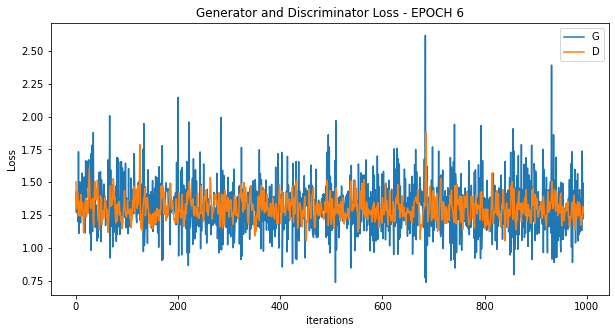

  0%|          | 0/994 [00:00<?, ?it/s]

[8/120][497/994] Loss_D: 1.1660 Loss_G: 1.4180 D(x): 0.5463 D(G(z)): 0.3947 / 0.2293
[8/120][994/994] Loss_D: 1.1862 Loss_G: 1.6403 D(x): 0.5347 D(G(z)): 0.3946 / 0.1721


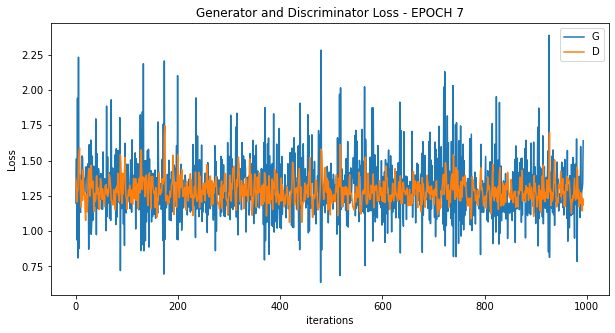

  0%|          | 0/994 [00:00<?, ?it/s]

[9/120][497/994] Loss_D: 1.1898 Loss_G: 1.1508 D(x): 0.4511 D(G(z)): 0.3023 / 0.3049
[9/120][994/994] Loss_D: 1.2786 Loss_G: 2.3676 D(x): 0.6346 D(G(z)): 0.5176 / 0.0787


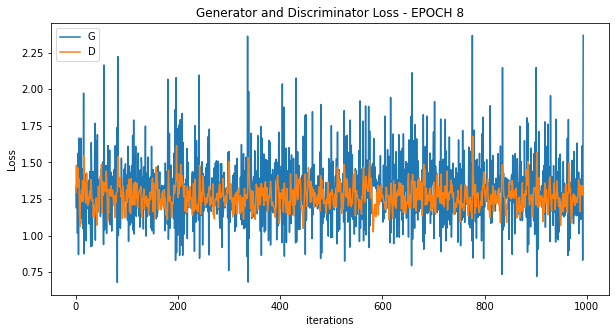

  0%|          | 0/994 [00:00<?, ?it/s]

[10/120][497/994] Loss_D: 1.2567 Loss_G: 0.9797 D(x): 0.4291 D(G(z)): 0.3126 / 0.3720
[10/120][994/994] Loss_D: 1.1765 Loss_G: 2.3393 D(x): 0.6812 D(G(z)): 0.4631 / 0.0906


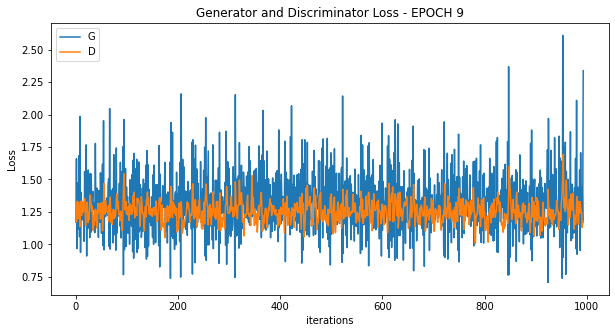

  0%|          | 0/994 [00:00<?, ?it/s]

[11/120][497/994] Loss_D: 1.3607 Loss_G: 1.3525 D(x): 0.5297 D(G(z)): 0.4675 / 0.2449
[11/120][994/994] Loss_D: 1.1528 Loss_G: 2.7546 D(x): 0.7089 D(G(z)): 0.4722 / 0.0554


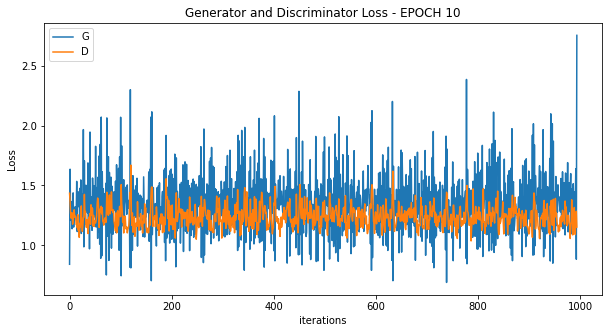

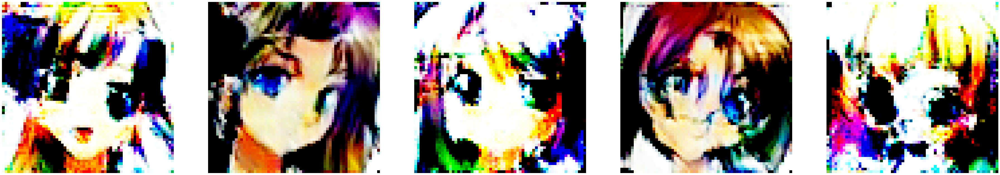

  0%|          | 0/994 [00:00<?, ?it/s]

[12/120][497/994] Loss_D: 1.0853 Loss_G: 1.5902 D(x): 0.5923 D(G(z)): 0.3698 / 0.1933
[12/120][994/994] Loss_D: 1.2245 Loss_G: 1.8612 D(x): 0.6194 D(G(z)): 0.4567 / 0.1491


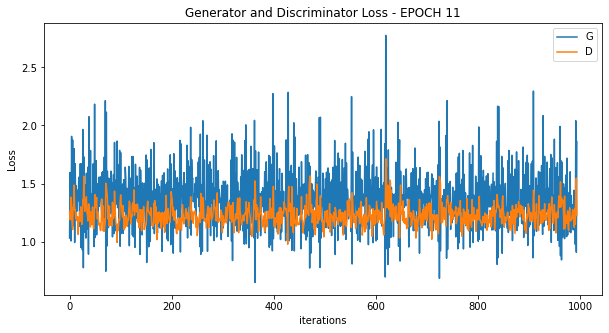

  0%|          | 0/994 [00:00<?, ?it/s]

[13/120][497/994] Loss_D: 1.2768 Loss_G: 1.7288 D(x): 0.6464 D(G(z)): 0.4921 / 0.1765
[13/120][994/994] Loss_D: 1.3002 Loss_G: 1.2938 D(x): 0.3671 D(G(z)): 0.2121 / 0.2714


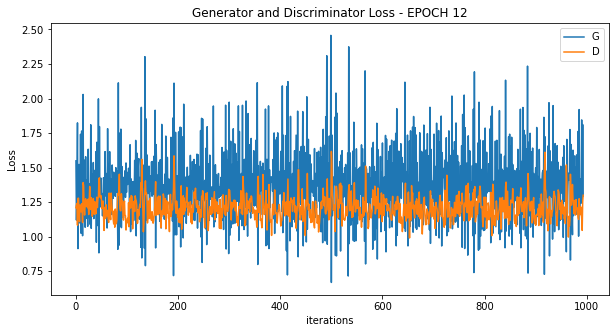

  0%|          | 0/994 [00:00<?, ?it/s]

[14/120][497/994] Loss_D: 1.1667 Loss_G: 1.3925 D(x): 0.5292 D(G(z)): 0.3499 / 0.2484
[14/120][994/994] Loss_D: 1.1126 Loss_G: 1.5035 D(x): 0.4542 D(G(z)): 0.2356 / 0.2027


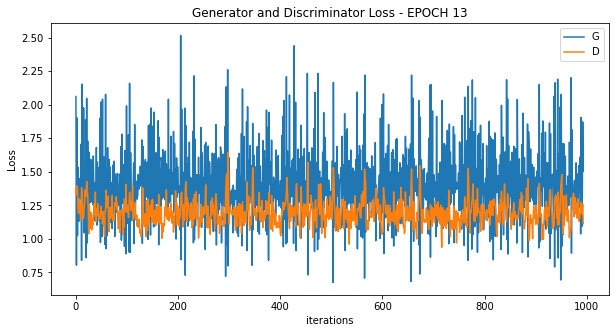

  0%|          | 0/994 [00:00<?, ?it/s]

[15/120][497/994] Loss_D: 1.2930 Loss_G: 2.1719 D(x): 0.7113 D(G(z)): 0.5312 / 0.1113
[15/120][994/994] Loss_D: 1.3590 Loss_G: 0.9649 D(x): 0.3824 D(G(z)): 0.2963 / 0.3662


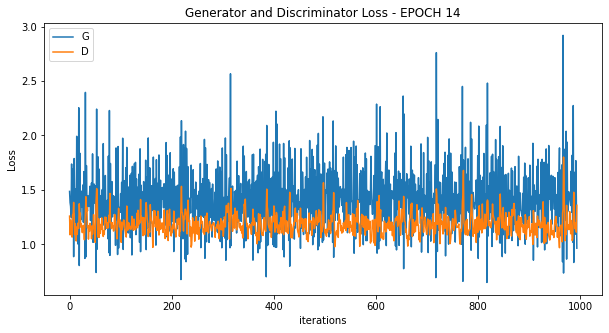

  0%|          | 0/994 [00:00<?, ?it/s]

[16/120][497/994] Loss_D: 1.0966 Loss_G: 1.7247 D(x): 0.6019 D(G(z)): 0.3713 / 0.1732
[16/120][994/994] Loss_D: 1.5182 Loss_G: 1.0621 D(x): 0.3197 D(G(z)): 0.2414 / 0.3291


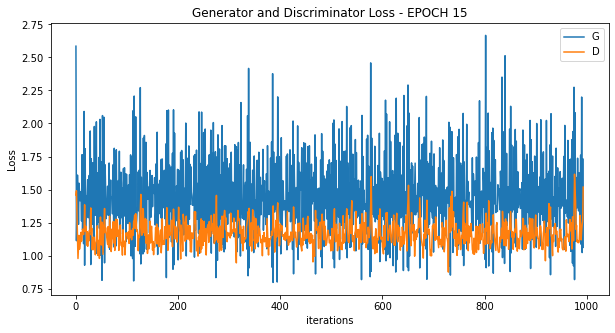

  0%|          | 0/994 [00:00<?, ?it/s]

[17/120][497/994] Loss_D: 1.1446 Loss_G: 1.2279 D(x): 0.4990 D(G(z)): 0.3134 / 0.2905
[17/120][994/994] Loss_D: 1.1485 Loss_G: 1.4245 D(x): 0.5252 D(G(z)): 0.3237 / 0.2378


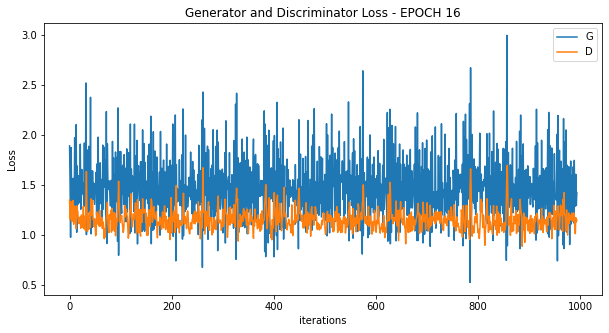

  0%|          | 0/994 [00:00<?, ?it/s]

[18/120][497/994] Loss_D: 1.2110 Loss_G: 1.6473 D(x): 0.6253 D(G(z)): 0.4514 / 0.1919
[18/120][994/994] Loss_D: 1.1272 Loss_G: 1.3887 D(x): 0.3976 D(G(z)): 0.1607 / 0.2390


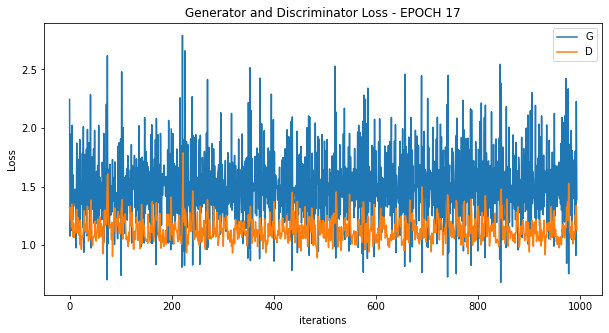

  0%|          | 0/994 [00:00<?, ?it/s]

[19/120][497/994] Loss_D: 1.0545 Loss_G: 1.8972 D(x): 0.6458 D(G(z)): 0.3798 / 0.1407
[19/120][994/994] Loss_D: 1.0400 Loss_G: 1.7497 D(x): 0.5286 D(G(z)): 0.2565 / 0.1629


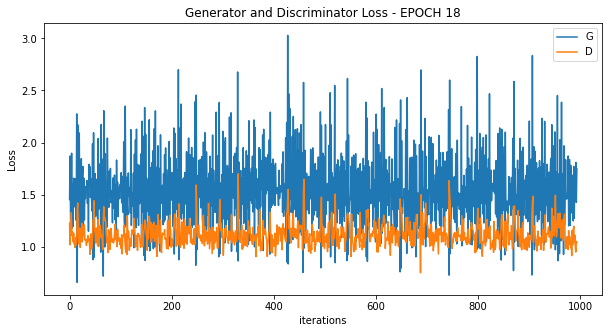

  0%|          | 0/994 [00:00<?, ?it/s]

[20/120][497/994] Loss_D: 1.0541 Loss_G: 1.3373 D(x): 0.5147 D(G(z)): 0.2439 / 0.2603
[20/120][994/994] Loss_D: 0.9187 Loss_G: 1.4632 D(x): 0.4633 D(G(z)): 0.0923 / 0.2132


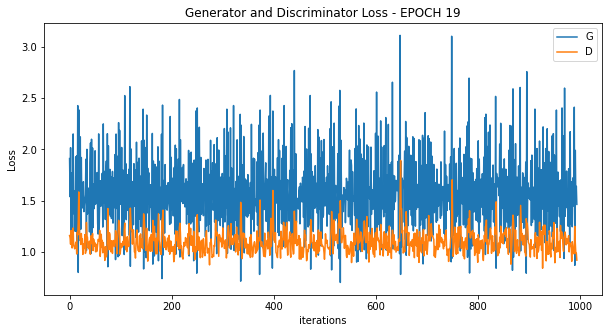

  0%|          | 0/994 [00:00<?, ?it/s]

[21/120][497/994] Loss_D: 1.1428 Loss_G: 1.0900 D(x): 0.4434 D(G(z)): 0.2145 / 0.3478
[21/120][994/994] Loss_D: 0.6781 Loss_G: 2.0248 D(x): 0.5975 D(G(z)): 0.0503 / 0.1145


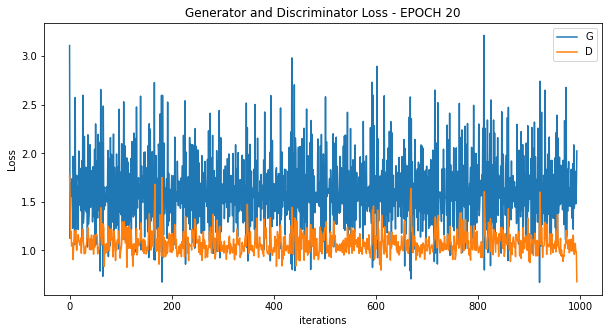

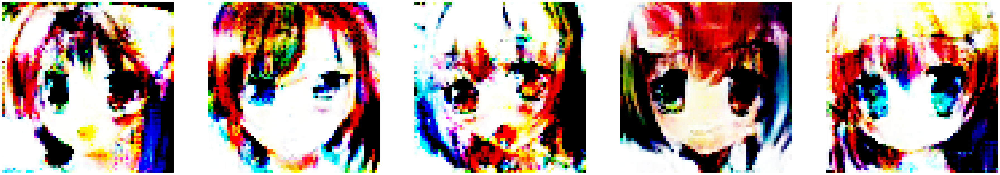

  0%|          | 0/994 [00:00<?, ?it/s]

[22/120][497/994] Loss_D: 0.9527 Loss_G: 1.8158 D(x): 0.6477 D(G(z)): 0.3123 / 0.1607
[22/120][994/994] Loss_D: 0.9780 Loss_G: 3.4887 D(x): 0.6240 D(G(z)): 0.3266 / 0.0282


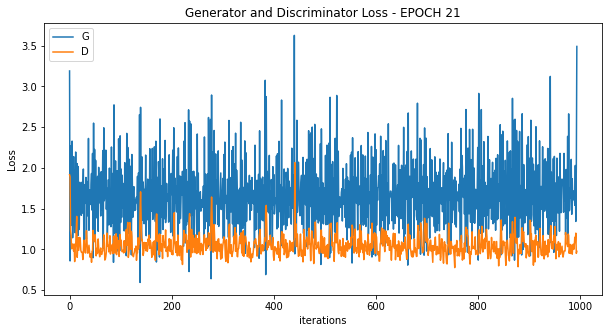

  0%|          | 0/994 [00:00<?, ?it/s]

[23/120][497/994] Loss_D: 0.9961 Loss_G: 1.3572 D(x): 0.5160 D(G(z)): 0.1909 / 0.2637
[23/120][994/994] Loss_D: 1.7518 Loss_G: 1.4062 D(x): 0.2022 D(G(z)): 0.0746 / 0.2526


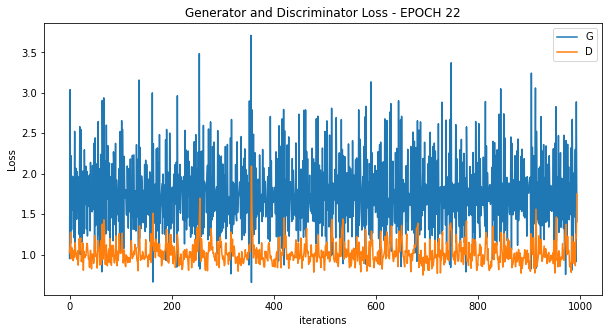

  0%|          | 0/994 [00:00<?, ?it/s]

[24/120][497/994] Loss_D: 1.1813 Loss_G: 0.7233 D(x): 0.3656 D(G(z)): 0.1294 / 0.5302
[24/120][994/994] Loss_D: 0.5964 Loss_G: 3.3532 D(x): 0.7381 D(G(z)): 0.1467 / 0.0289


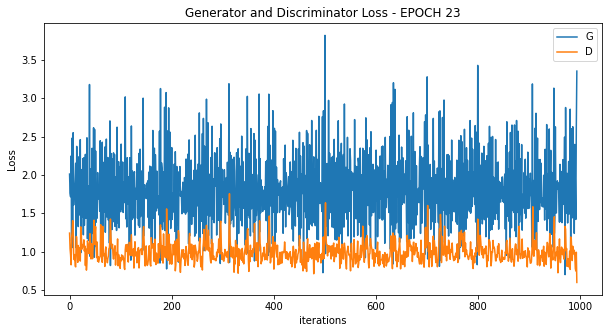

  0%|          | 0/994 [00:00<?, ?it/s]

[25/120][497/994] Loss_D: 0.9480 Loss_G: 2.1091 D(x): 0.6624 D(G(z)): 0.2925 / 0.1291
[25/120][994/994] Loss_D: 0.7201 Loss_G: 3.3817 D(x): 0.8444 D(G(z)): 0.2827 / 0.0261


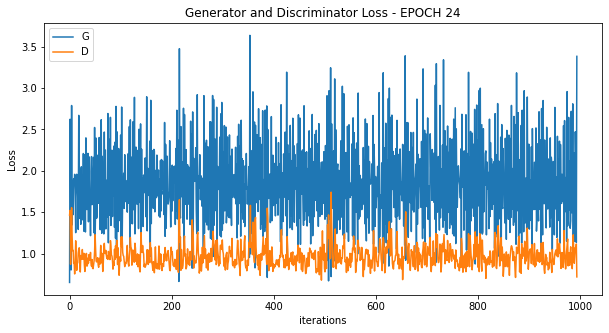

  0%|          | 0/994 [00:00<?, ?it/s]

[26/120][497/994] Loss_D: 1.0268 Loss_G: 3.0433 D(x): 0.8471 D(G(z)): 0.4423 / 0.0442
[26/120][994/994] Loss_D: 1.2041 Loss_G: 5.7566 D(x): 0.8878 D(G(z)): 0.5703 / 0.0020


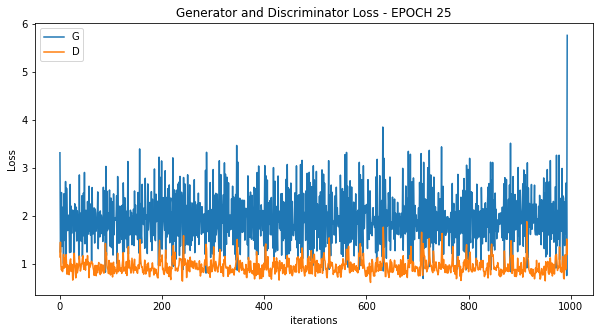

  0%|          | 0/994 [00:00<?, ?it/s]

[27/120][497/994] Loss_D: 0.8298 Loss_G: 1.8882 D(x): 0.6602 D(G(z)): 0.2304 / 0.1527
[27/120][994/994] Loss_D: 0.5526 Loss_G: 2.9827 D(x): 0.8828 D(G(z)): 0.1243 / 0.0461


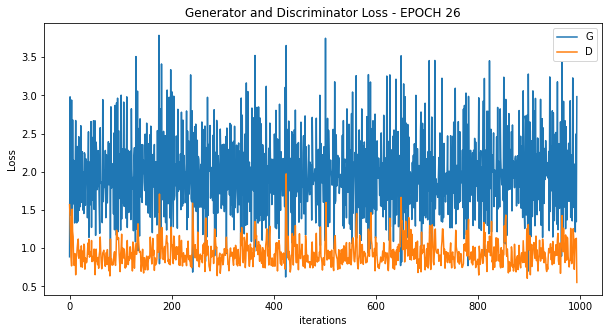

  0%|          | 0/994 [00:00<?, ?it/s]

[28/120][497/994] Loss_D: 1.5095 Loss_G: 4.0481 D(x): 0.9196 D(G(z)): 0.6223 / 0.0152
[28/120][994/994] Loss_D: 1.1507 Loss_G: 2.2398 D(x): 0.4879 D(G(z)): 0.1877 / 0.1116


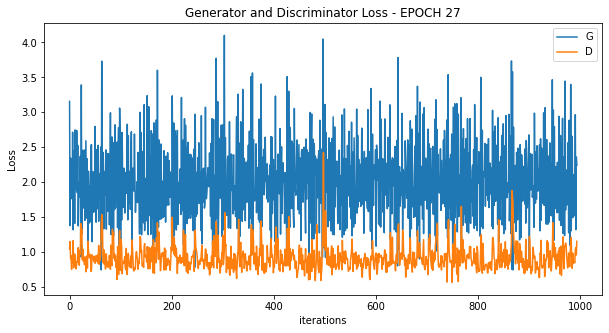

  0%|          | 0/994 [00:00<?, ?it/s]

[29/120][497/994] Loss_D: 0.7888 Loss_G: 1.5042 D(x): 0.5898 D(G(z)): 0.1145 / 0.2491
[29/120][994/994] Loss_D: 1.0084 Loss_G: 2.4272 D(x): 0.5439 D(G(z)): 0.2307 / 0.0781


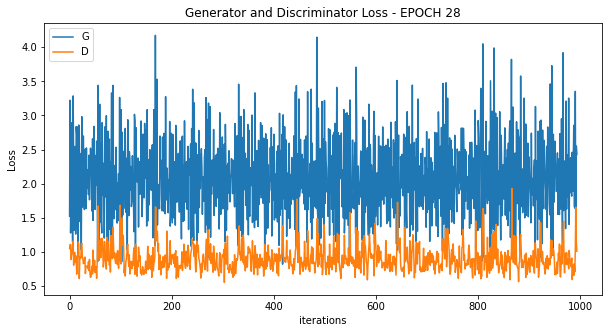

  0%|          | 0/994 [00:00<?, ?it/s]

[30/120][497/994] Loss_D: 0.9379 Loss_G: 1.6999 D(x): 0.5908 D(G(z)): 0.2464 / 0.2014
[30/120][994/994] Loss_D: 1.2515 Loss_G: 1.3767 D(x): 0.3575 D(G(z)): 0.1350 / 0.2620


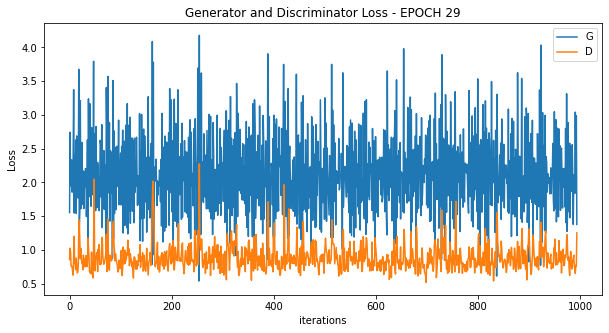

  0%|          | 0/994 [00:00<?, ?it/s]

[31/120][497/994] Loss_D: 0.8562 Loss_G: 2.8304 D(x): 0.7712 D(G(z)): 0.3141 / 0.0611
[31/120][994/994] Loss_D: 0.7133 Loss_G: 1.5556 D(x): 0.6017 D(G(z)): 0.0717 / 0.2091


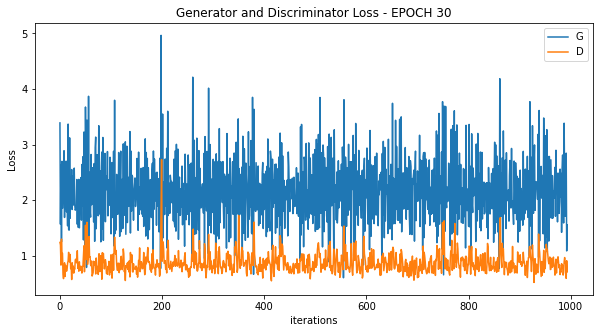

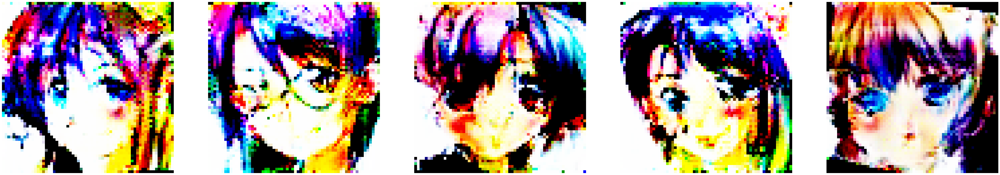

  0%|          | 0/994 [00:00<?, ?it/s]

[32/120][497/994] Loss_D: 0.8103 Loss_G: 2.7467 D(x): 0.7973 D(G(z)): 0.3048 / 0.0617
[32/120][994/994] Loss_D: 1.4595 Loss_G: 1.7223 D(x): 0.3448 D(G(z)): 0.1171 / 0.2023


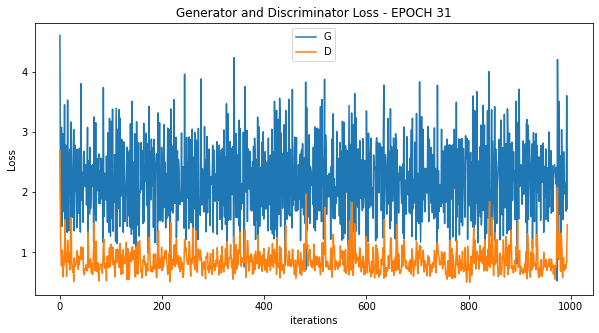

  0%|          | 0/994 [00:00<?, ?it/s]

[33/120][497/994] Loss_D: 0.8874 Loss_G: 2.1524 D(x): 0.6908 D(G(z)): 0.2940 / 0.1208
[33/120][994/994] Loss_D: 0.9685 Loss_G: 3.2623 D(x): 0.7338 D(G(z)): 0.3268 / 0.0323


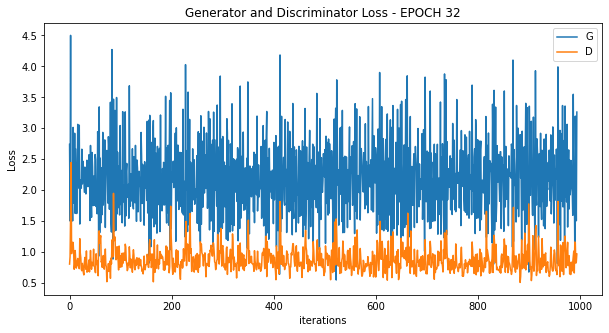

  0%|          | 0/994 [00:00<?, ?it/s]

[34/120][497/994] Loss_D: 0.8636 Loss_G: 2.6250 D(x): 0.8117 D(G(z)): 0.3207 / 0.0830
[34/120][994/994] Loss_D: 0.9536 Loss_G: 3.0401 D(x): 0.7368 D(G(z)): 0.3179 / 0.0400


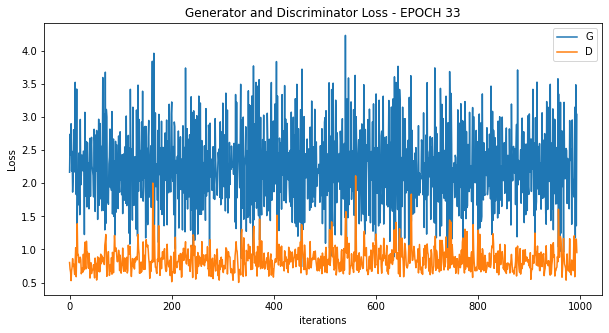

  0%|          | 0/994 [00:00<?, ?it/s]

[35/120][497/994] Loss_D: 0.9006 Loss_G: 3.4491 D(x): 0.9175 D(G(z)): 0.3580 / 0.0303
[35/120][994/994] Loss_D: 0.6926 Loss_G: 2.3949 D(x): 0.5975 D(G(z)): 0.0734 / 0.1067


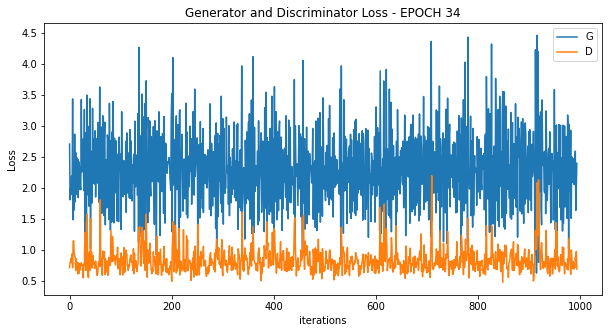

  0%|          | 0/994 [00:00<?, ?it/s]

[36/120][497/994] Loss_D: 0.8137 Loss_G: 1.9440 D(x): 0.6245 D(G(z)): 0.1707 / 0.1589
[36/120][994/994] Loss_D: 0.3698 Loss_G: 3.8225 D(x): 0.9140 D(G(z)): 0.0243 / 0.0179


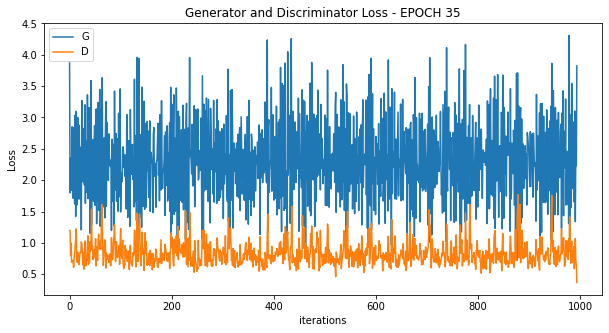

  0%|          | 0/994 [00:00<?, ?it/s]

[37/120][497/994] Loss_D: 0.8452 Loss_G: 3.4961 D(x): 0.8454 D(G(z)): 0.3202 / 0.0278
[37/120][994/994] Loss_D: 0.9430 Loss_G: 2.1271 D(x): 0.5398 D(G(z)): 0.0364 / 0.1303


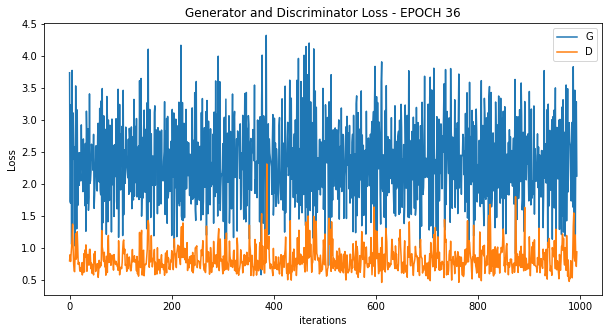

  0%|          | 0/994 [00:00<?, ?it/s]

[38/120][497/994] Loss_D: 1.2272 Loss_G: 3.3390 D(x): 0.8955 D(G(z)): 0.5229 / 0.0339
[38/120][994/994] Loss_D: 0.4679 Loss_G: 3.6495 D(x): 0.9445 D(G(z)): 0.0815 / 0.0222


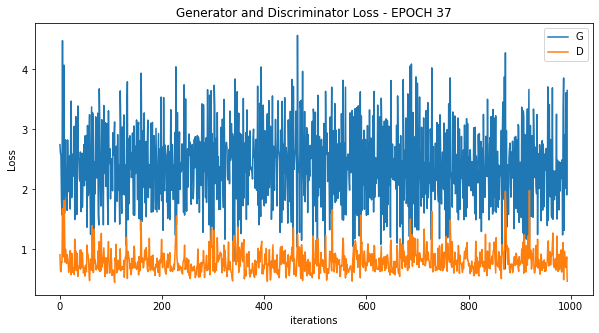

  0%|          | 0/994 [00:00<?, ?it/s]

[39/120][497/994] Loss_D: 0.6449 Loss_G: 2.6652 D(x): 0.8383 D(G(z)): 0.2026 / 0.0688
[39/120][994/994] Loss_D: 1.1784 Loss_G: 2.0317 D(x): 0.4490 D(G(z)): 0.1604 / 0.1495


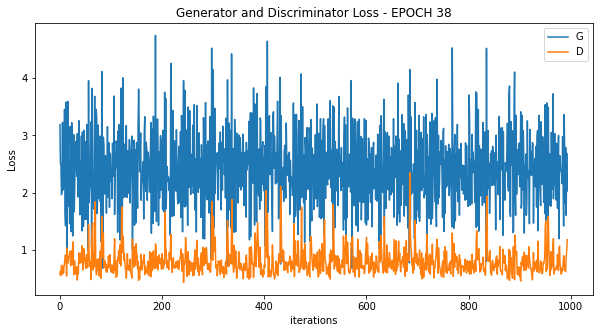

  0%|          | 0/994 [00:00<?, ?it/s]

[40/120][497/994] Loss_D: 0.7175 Loss_G: 2.1256 D(x): 0.6000 D(G(z)): 0.0654 / 0.1445
[40/120][994/994] Loss_D: 0.5505 Loss_G: 3.9082 D(x): 0.9727 D(G(z)): 0.1074 / 0.0166


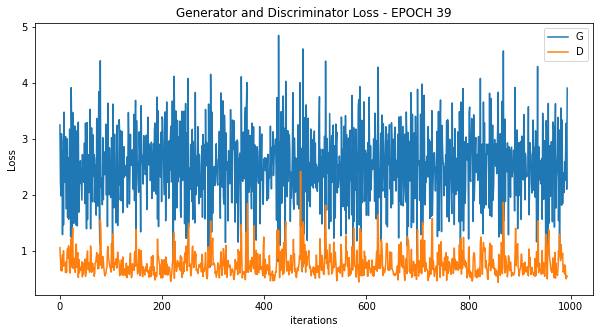

  0%|          | 0/994 [00:00<?, ?it/s]

[41/120][497/994] Loss_D: 0.7590 Loss_G: 2.5151 D(x): 0.8016 D(G(z)): 0.2549 / 0.0907
[41/120][994/994] Loss_D: 0.7129 Loss_G: 2.7386 D(x): 0.7031 D(G(z)): 0.1759 / 0.0571


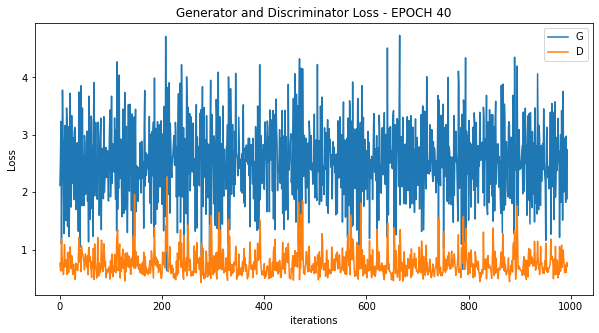

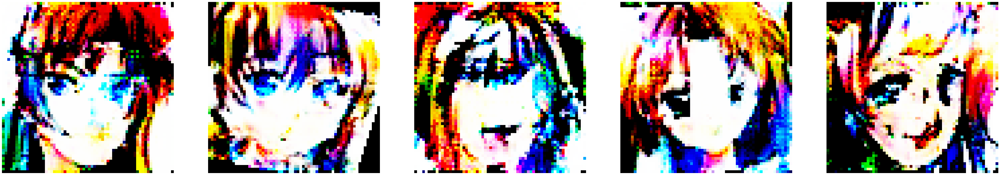

  0%|          | 0/994 [00:00<?, ?it/s]

[42/120][497/994] Loss_D: 1.3676 Loss_G: 3.5591 D(x): 0.9360 D(G(z)): 0.5474 / 0.0258
[42/120][994/994] Loss_D: 1.1151 Loss_G: 1.5109 D(x): 0.4342 D(G(z)): 0.0746 / 0.3063


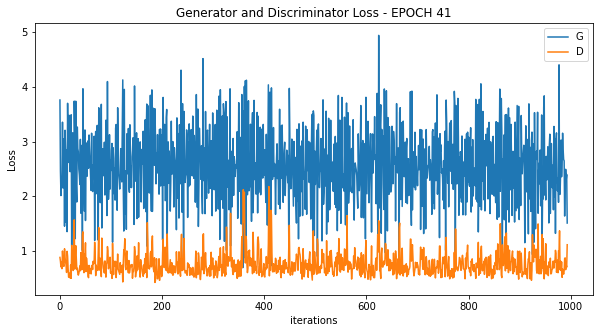

  0%|          | 0/994 [00:00<?, ?it/s]

[43/120][497/994] Loss_D: 0.8914 Loss_G: 0.9941 D(x): 0.5160 D(G(z)): 0.1118 / 0.4130
[43/120][994/994] Loss_D: 0.5727 Loss_G: 3.9930 D(x): 0.8097 D(G(z)): 0.1268 / 0.0175


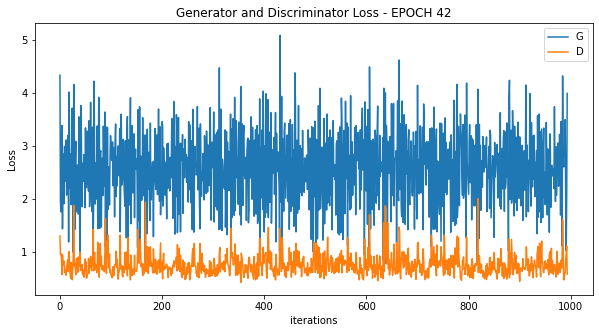

  0%|          | 0/994 [00:00<?, ?it/s]

[44/120][497/994] Loss_D: 0.9369 Loss_G: 3.5405 D(x): 0.9536 D(G(z)): 0.3742 / 0.0288
[44/120][994/994] Loss_D: 0.6665 Loss_G: 5.2140 D(x): 0.9393 D(G(z)): 0.2283 / 0.0040


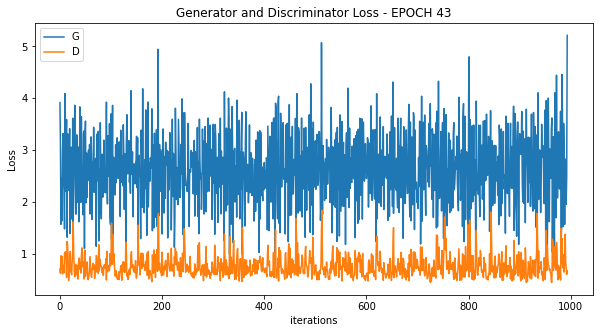

  0%|          | 0/994 [00:00<?, ?it/s]

[45/120][497/994] Loss_D: 0.5782 Loss_G: 2.8018 D(x): 0.8492 D(G(z)): 0.1583 / 0.0690
[45/120][994/994] Loss_D: 0.5742 Loss_G: 2.5228 D(x): 0.7970 D(G(z)): 0.1332 / 0.0727


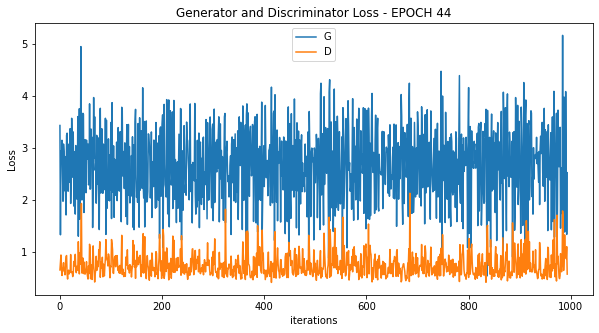

  0%|          | 0/994 [00:00<?, ?it/s]

[46/120][497/994] Loss_D: 0.4959 Loss_G: 3.2851 D(x): 0.8245 D(G(z)): 0.0886 / 0.0414
[46/120][994/994] Loss_D: 0.7995 Loss_G: 2.1835 D(x): 0.5774 D(G(z)): 0.1506 / 0.1115


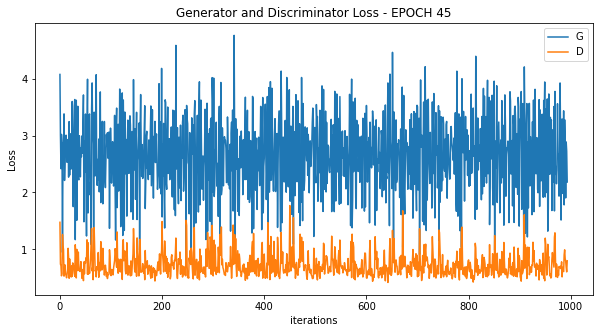

  0%|          | 0/994 [00:00<?, ?it/s]

[47/120][497/994] Loss_D: 0.5053 Loss_G: 3.0499 D(x): 0.8483 D(G(z)): 0.1072 / 0.0530
[47/120][994/994] Loss_D: 0.5053 Loss_G: 3.6421 D(x): 0.9168 D(G(z)): 0.1089 / 0.0264


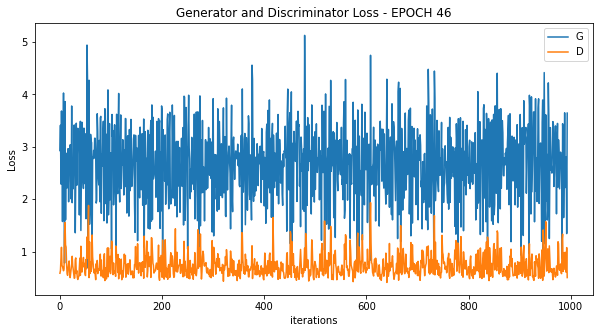

  0%|          | 0/994 [00:00<?, ?it/s]

[48/120][497/994] Loss_D: 0.5096 Loss_G: 3.7160 D(x): 0.8860 D(G(z)): 0.1111 / 0.0265
[48/120][994/994] Loss_D: 0.8004 Loss_G: 2.9574 D(x): 0.6314 D(G(z)): 0.1321 / 0.0481


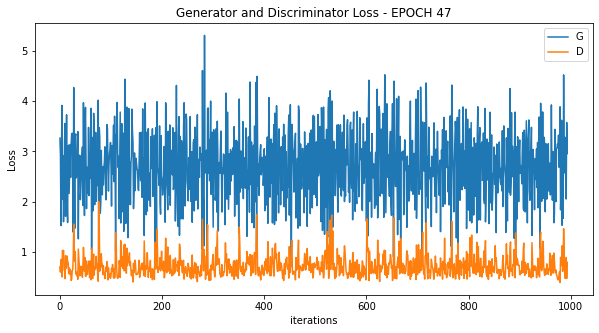

  0%|          | 0/994 [00:00<?, ?it/s]

[49/120][497/994] Loss_D: 0.4551 Loss_G: 4.0997 D(x): 0.9156 D(G(z)): 0.0745 / 0.0180
[49/120][994/994] Loss_D: 0.8462 Loss_G: 1.8567 D(x): 0.5237 D(G(z)): 0.0613 / 0.1826


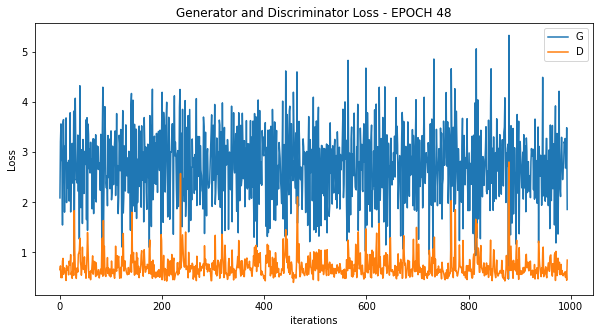

  0%|          | 0/994 [00:00<?, ?it/s]

[50/120][497/994] Loss_D: 0.5202 Loss_G: 3.6054 D(x): 0.8540 D(G(z)): 0.1199 / 0.0269
[50/120][994/994] Loss_D: 1.6718 Loss_G: 1.1312 D(x): 0.2246 D(G(z)): 0.0309 / 0.4026


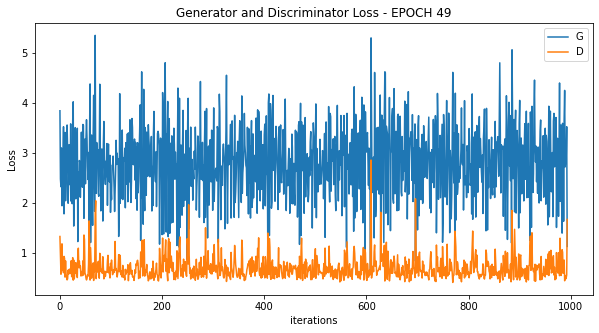

  0%|          | 0/994 [00:00<?, ?it/s]

[51/120][497/994] Loss_D: 0.5362 Loss_G: 3.5097 D(x): 0.8569 D(G(z)): 0.1368 / 0.0270
[51/120][994/994] Loss_D: 0.5825 Loss_G: 3.1960 D(x): 0.7954 D(G(z)): 0.1266 / 0.0334


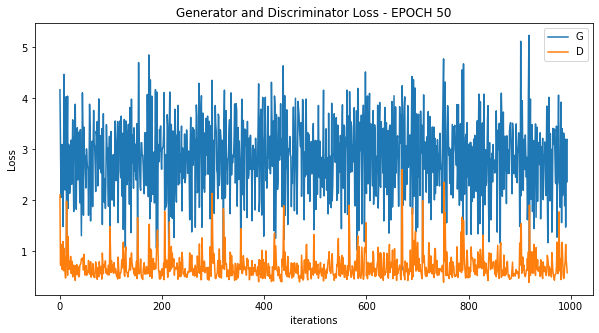

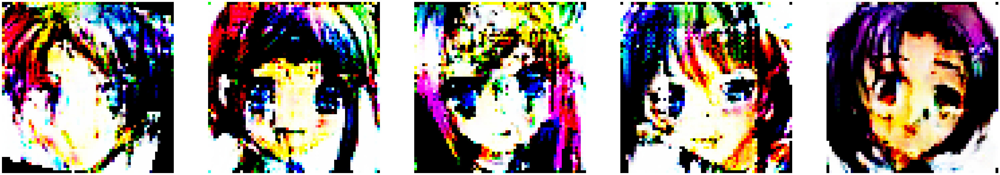

  0%|          | 0/994 [00:00<?, ?it/s]

[52/120][497/994] Loss_D: 0.8826 Loss_G: 1.0003 D(x): 0.5385 D(G(z)): 0.1090 / 0.4102
[52/120][994/994] Loss_D: 0.4471 Loss_G: 4.0919 D(x): 0.9629 D(G(z)): 0.0589 / 0.0152


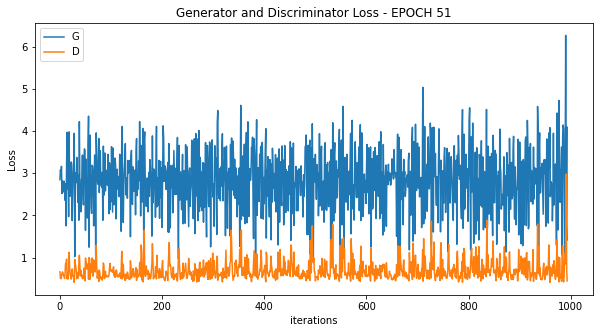

  0%|          | 0/994 [00:00<?, ?it/s]

[53/120][497/994] Loss_D: 0.5147 Loss_G: 3.0569 D(x): 0.7443 D(G(z)): 0.0550 / 0.0527
[53/120][994/994] Loss_D: 2.4684 Loss_G: 11.2587 D(x): 0.9049 D(G(z)): 0.8284 / 0.0000


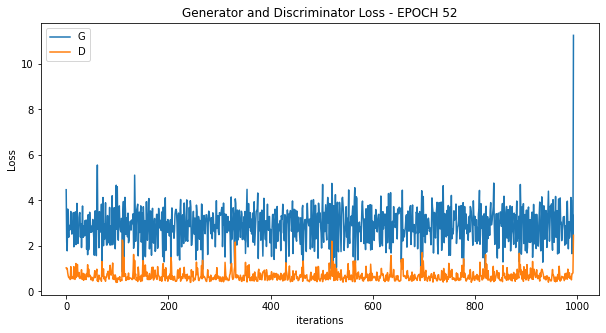

  0%|          | 0/994 [00:00<?, ?it/s]

[54/120][497/994] Loss_D: 0.6225 Loss_G: 3.6421 D(x): 0.9063 D(G(z)): 0.1891 / 0.0279
[54/120][994/994] Loss_D: 1.0529 Loss_G: 1.6642 D(x): 0.4044 D(G(z)): 0.0137 / 0.1937


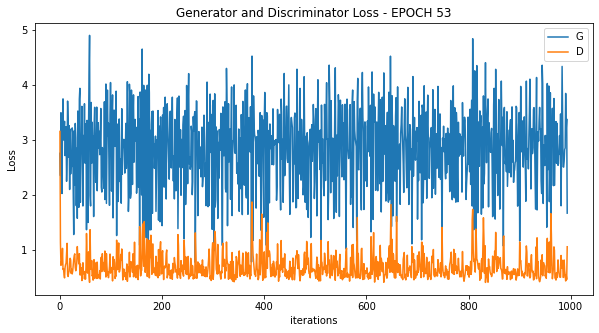

  0%|          | 0/994 [00:00<?, ?it/s]

[55/120][497/994] Loss_D: 1.2740 Loss_G: 1.3163 D(x): 0.3311 D(G(z)): 0.0609 / 0.2937
[55/120][994/994] Loss_D: 1.1955 Loss_G: 3.2975 D(x): 0.5121 D(G(z)): 0.3002 / 0.0323


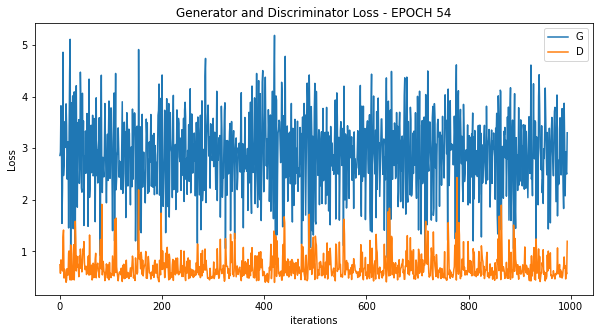

  0%|          | 0/994 [00:00<?, ?it/s]

[56/120][497/994] Loss_D: 0.6304 Loss_G: 2.6464 D(x): 0.9187 D(G(z)): 0.2055 / 0.0936
[56/120][994/994] Loss_D: 0.4118 Loss_G: 5.2102 D(x): 0.7871 D(G(z)): 0.0082 / 0.0058


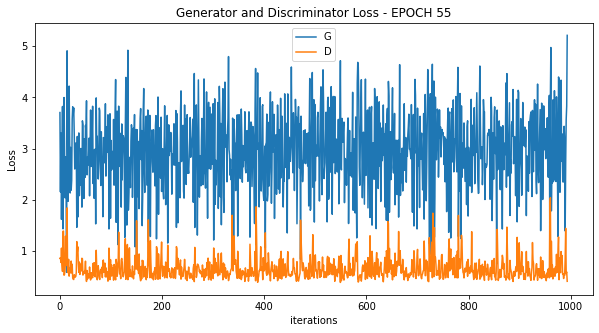

  0%|          | 0/994 [00:00<?, ?it/s]

[57/120][497/994] Loss_D: 0.5422 Loss_G: 3.0626 D(x): 0.7303 D(G(z)): 0.0467 / 0.0506
[57/120][994/994] Loss_D: 0.4938 Loss_G: 4.2300 D(x): 0.9061 D(G(z)): 0.0901 / 0.0111


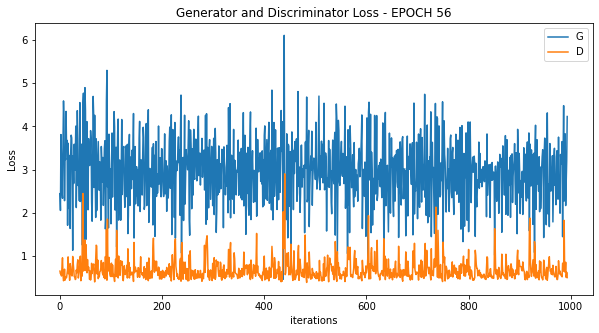

  0%|          | 0/994 [00:00<?, ?it/s]

[58/120][497/994] Loss_D: 0.6250 Loss_G: 3.0227 D(x): 0.8517 D(G(z)): 0.1778 / 0.0605
[58/120][994/994] Loss_D: 0.4689 Loss_G: 4.0110 D(x): 0.9455 D(G(z)): 0.0384 / 0.0183


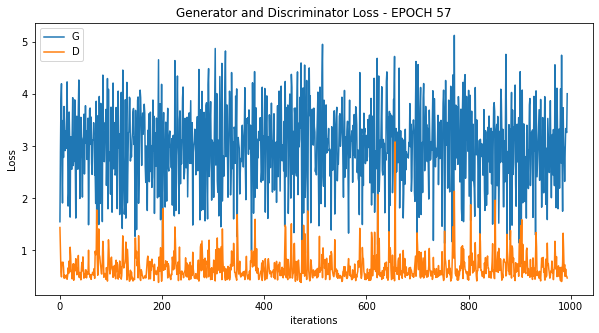

  0%|          | 0/994 [00:00<?, ?it/s]

[59/120][497/994] Loss_D: 0.5053 Loss_G: 2.9638 D(x): 0.9044 D(G(z)): 0.1061 / 0.0547
[59/120][994/994] Loss_D: 0.6590 Loss_G: 4.7943 D(x): 0.8852 D(G(z)): 0.2634 / 0.0082


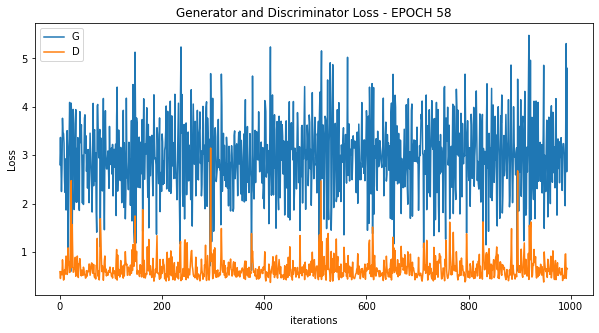

  0%|          | 0/994 [00:00<?, ?it/s]

[60/120][497/994] Loss_D: 0.6558 Loss_G: 3.0171 D(x): 0.8873 D(G(z)): 0.2220 / 0.0558
[60/120][994/994] Loss_D: 0.8230 Loss_G: 6.4315 D(x): 0.7358 D(G(z)): 0.2709 / 0.0018


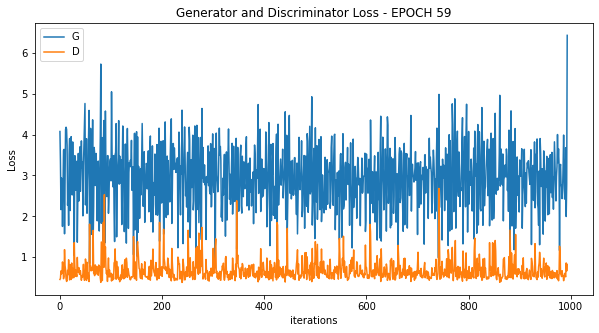

  0%|          | 0/994 [00:00<?, ?it/s]

[61/120][497/994] Loss_D: 1.1137 Loss_G: 1.5551 D(x): 0.3763 D(G(z)): 0.0373 / 0.2468
[61/120][994/994] Loss_D: 2.8028 Loss_G: 1.1310 D(x): 0.0813 D(G(z)): 0.0771 / 0.3628


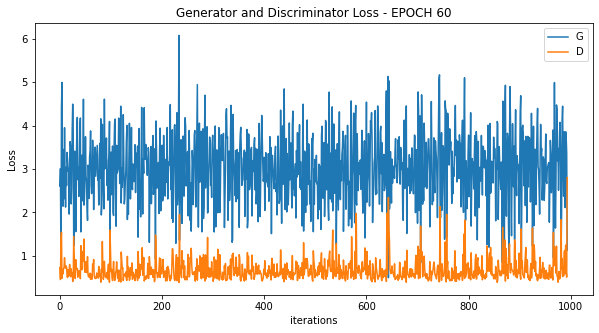

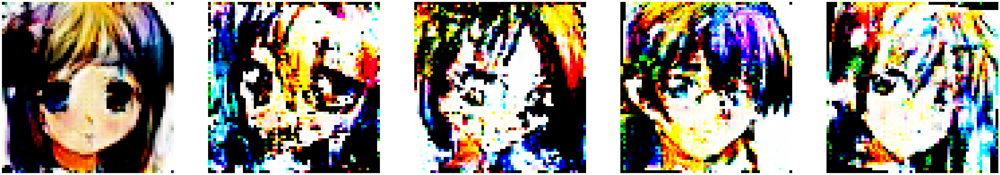

  0%|          | 0/994 [00:00<?, ?it/s]

[62/120][497/994] Loss_D: 0.7976 Loss_G: 1.9848 D(x): 0.5456 D(G(z)): 0.0510 / 0.1643
[62/120][994/994] Loss_D: 0.3750 Loss_G: 5.2314 D(x): 0.9555 D(G(z)): 0.0094 / 0.0047


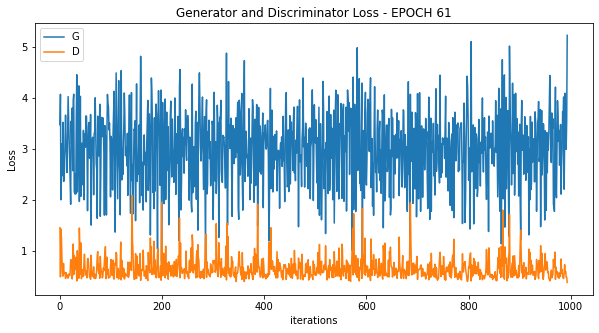

  0%|          | 0/994 [00:00<?, ?it/s]

[63/120][497/994] Loss_D: 0.4413 Loss_G: 4.4342 D(x): 0.8290 D(G(z)): 0.0470 / 0.0107
[63/120][994/994] Loss_D: 0.4808 Loss_G: 4.4736 D(x): 0.9635 D(G(z)): 0.0396 / 0.0144


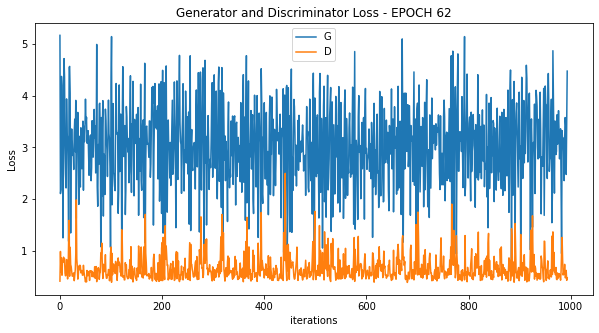

  0%|          | 0/994 [00:00<?, ?it/s]

[64/120][497/994] Loss_D: 0.6206 Loss_G: 2.2623 D(x): 0.7636 D(G(z)): 0.1340 / 0.1120
[64/120][994/994] Loss_D: 1.5835 Loss_G: 3.9875 D(x): 0.4291 D(G(z)): 0.3768 / 0.0146


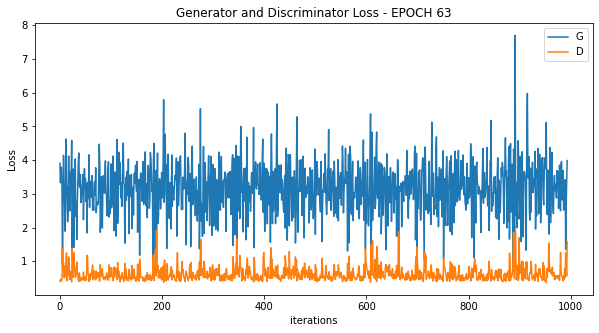

  0%|          | 0/994 [00:00<?, ?it/s]

[65/120][497/994] Loss_D: 0.5036 Loss_G: 3.2492 D(x): 0.8847 D(G(z)): 0.1292 / 0.0405
[65/120][994/994] Loss_D: 1.1067 Loss_G: 1.5286 D(x): 0.3676 D(G(z)): 0.0290 / 0.2713


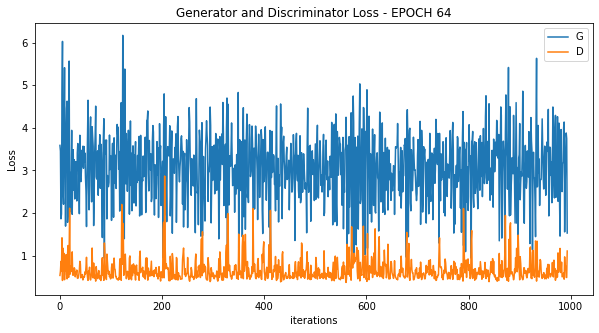

  0%|          | 0/994 [00:00<?, ?it/s]

[66/120][497/994] Loss_D: 0.5986 Loss_G: 2.9483 D(x): 0.6323 D(G(z)): 0.0131 / 0.0539
[66/120][994/994] Loss_D: 0.5586 Loss_G: 3.6374 D(x): 0.6844 D(G(z)): 0.0217 / 0.0254


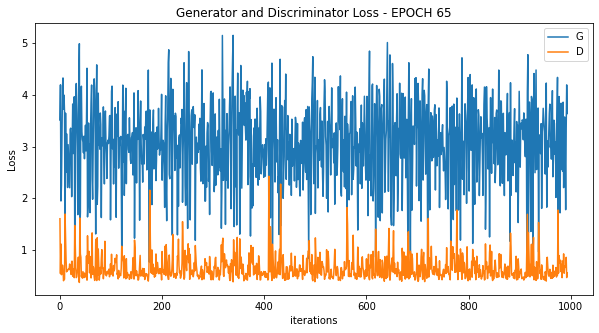

  0%|          | 0/994 [00:00<?, ?it/s]

[67/120][497/994] Loss_D: 0.5888 Loss_G: 2.0543 D(x): 0.7363 D(G(z)): 0.1078 / 0.1376
[67/120][994/994] Loss_D: 0.5010 Loss_G: 2.3872 D(x): 0.7484 D(G(z)): 0.0259 / 0.0889


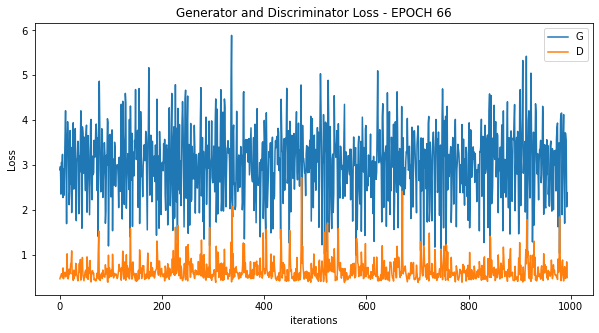

  0%|          | 0/994 [00:00<?, ?it/s]

[68/120][497/994] Loss_D: 0.4844 Loss_G: 4.1097 D(x): 0.7666 D(G(z)): 0.0132 / 0.0149
[68/120][994/994] Loss_D: 2.4095 Loss_G: 1.3744 D(x): 0.0890 D(G(z)): 0.0075 / 0.3047


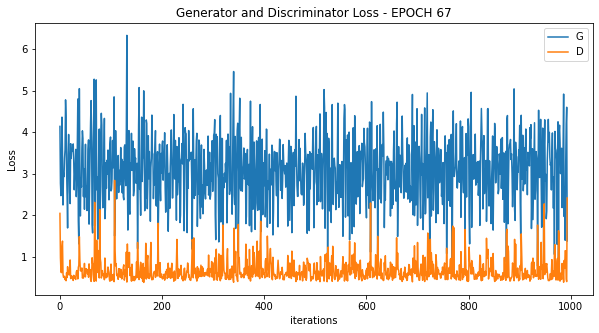

  0%|          | 0/994 [00:00<?, ?it/s]

[69/120][497/994] Loss_D: 0.4538 Loss_G: 3.4816 D(x): 0.8230 D(G(z)): 0.0521 / 0.0363
[69/120][994/994] Loss_D: 1.5378 Loss_G: 7.9199 D(x): 0.8878 D(G(z)): 0.6081 / 0.0003


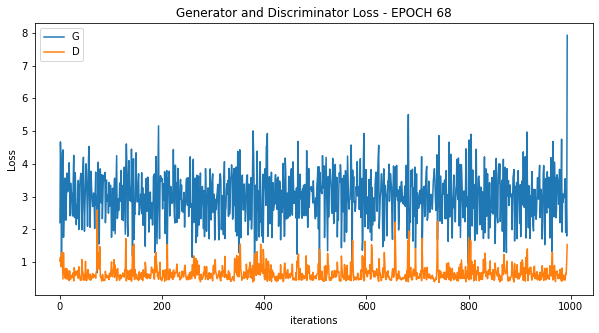

  0%|          | 0/994 [00:00<?, ?it/s]

[70/120][497/994] Loss_D: 0.5529 Loss_G: 3.3399 D(x): 0.8486 D(G(z)): 0.1430 / 0.0390
[70/120][994/994] Loss_D: 1.1802 Loss_G: 0.8494 D(x): 0.3938 D(G(z)): 0.1172 / 0.4499


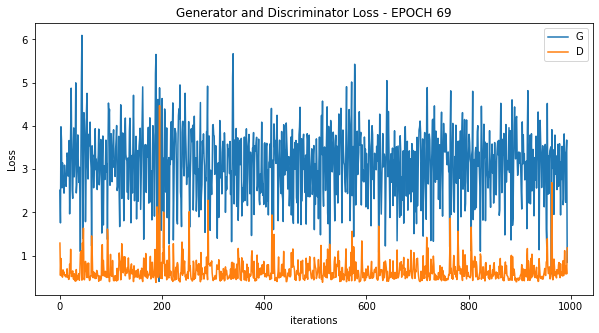

  0%|          | 0/994 [00:00<?, ?it/s]

[71/120][497/994] Loss_D: 0.9939 Loss_G: 1.7843 D(x): 0.4780 D(G(z)): 0.0951 / 0.2292
[71/120][994/994] Loss_D: 0.4669 Loss_G: 3.3352 D(x): 0.7216 D(G(z)): 0.0192 / 0.0293


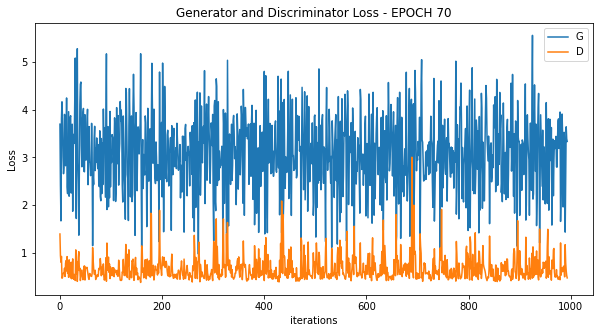

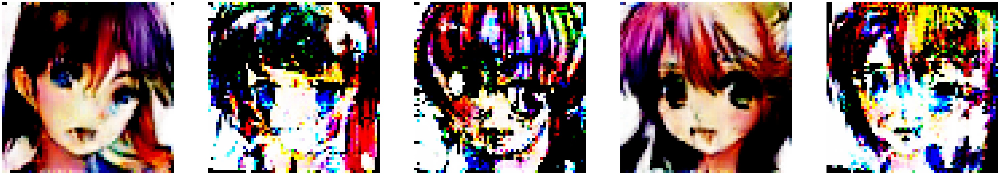

  0%|          | 0/994 [00:00<?, ?it/s]

[72/120][497/994] Loss_D: 0.9670 Loss_G: 2.0378 D(x): 0.4659 D(G(z)): 0.0501 / 0.1598
[72/120][994/994] Loss_D: 0.9828 Loss_G: 1.8545 D(x): 0.4119 D(G(z)): 0.0182 / 0.2056


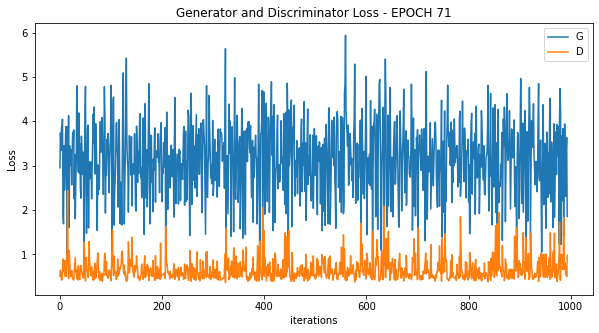

  0%|          | 0/994 [00:00<?, ?it/s]

[73/120][497/994] Loss_D: 0.7832 Loss_G: 1.9463 D(x): 0.5224 D(G(z)): 0.0224 / 0.1578
[73/120][994/994] Loss_D: 0.9200 Loss_G: 2.4738 D(x): 0.5601 D(G(z)): 0.1649 / 0.1263


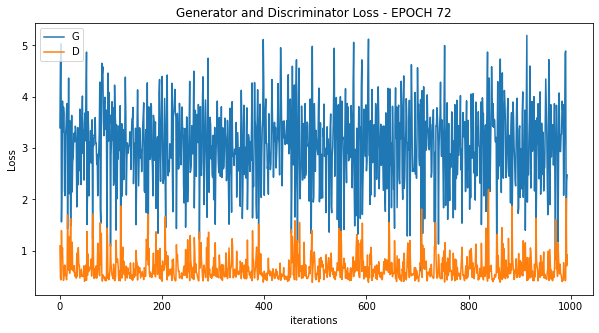

  0%|          | 0/994 [00:00<?, ?it/s]

[74/120][497/994] Loss_D: 0.5197 Loss_G: 4.7144 D(x): 0.6982 D(G(z)): 0.0056 / 0.0101
[74/120][994/994] Loss_D: 3.3830 Loss_G: 4.3813 D(x): 0.0250 D(G(z)): 0.0002 / 0.0155


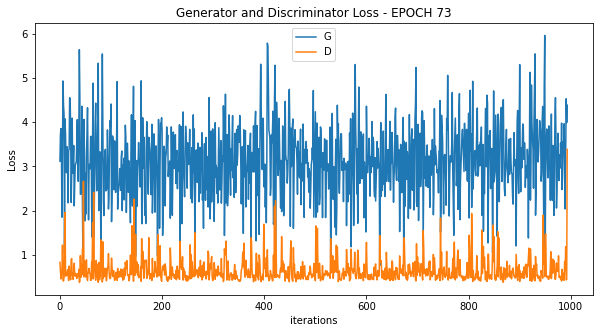

  0%|          | 0/994 [00:00<?, ?it/s]

[75/120][497/994] Loss_D: 1.1012 Loss_G: 2.9952 D(x): 0.9270 D(G(z)): 0.4652 / 0.0459
[75/120][994/994] Loss_D: 0.8438 Loss_G: 2.5238 D(x): 0.4835 D(G(z)): 0.0650 / 0.1010


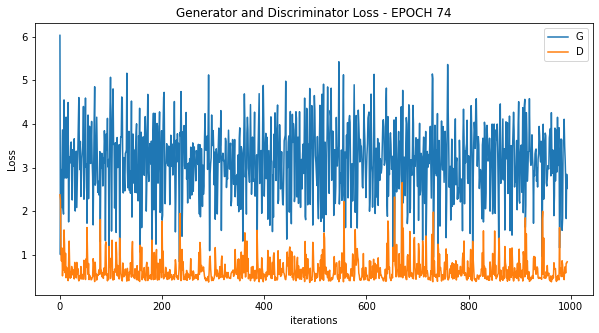

  0%|          | 0/994 [00:00<?, ?it/s]

[76/120][497/994] Loss_D: 0.4598 Loss_G: 5.0131 D(x): 0.7614 D(G(z)): 0.0043 / 0.0060
[76/120][994/994] Loss_D: 0.4709 Loss_G: 2.2469 D(x): 0.8426 D(G(z)): 0.0639 / 0.0969


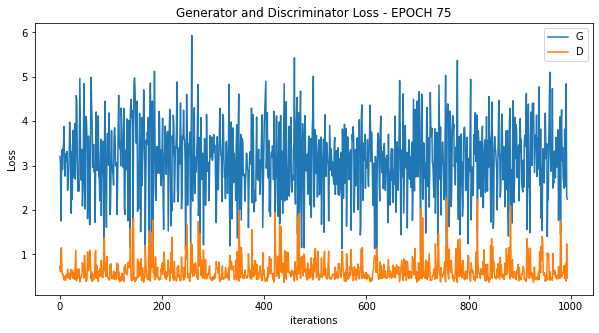

  0%|          | 0/994 [00:00<?, ?it/s]

[77/120][497/994] Loss_D: 0.4923 Loss_G: 3.0666 D(x): 0.8905 D(G(z)): 0.0927 / 0.0608
[77/120][994/994] Loss_D: 2.4518 Loss_G: 1.8987 D(x): 0.1159 D(G(z)): 0.0126 / 0.1818


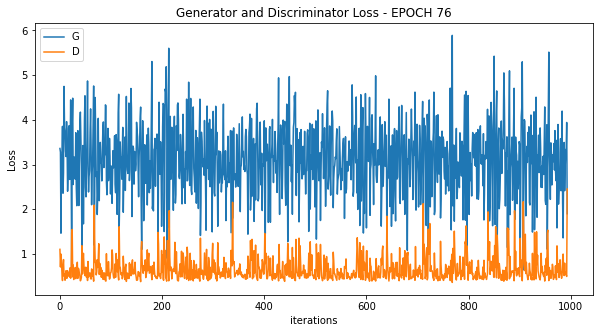

  0%|          | 0/994 [00:00<?, ?it/s]

[78/120][497/994] Loss_D: 0.4589 Loss_G: 4.6814 D(x): 0.7423 D(G(z)): 0.0042 / 0.0117
[78/120][994/994] Loss_D: 2.4591 Loss_G: 2.8689 D(x): 0.0873 D(G(z)): 0.0028 / 0.0755


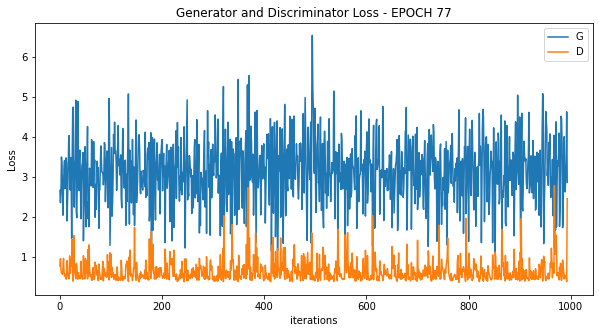

  0%|          | 0/994 [00:00<?, ?it/s]

[79/120][497/994] Loss_D: 1.3845 Loss_G: 1.3937 D(x): 0.2772 D(G(z)): 0.0414 / 0.2921
[79/120][994/994] Loss_D: 0.5660 Loss_G: 3.6900 D(x): 0.9604 D(G(z)): 0.1170 / 0.0211


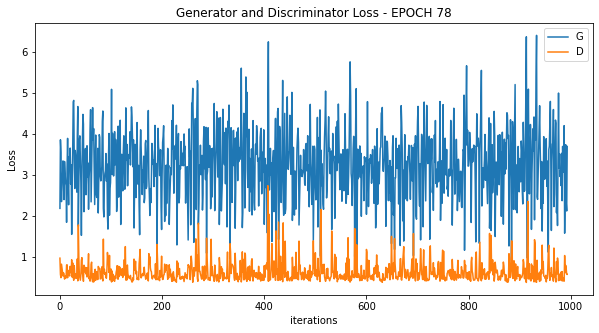

  0%|          | 0/994 [00:00<?, ?it/s]

[80/120][497/994] Loss_D: 0.7370 Loss_G: 2.8444 D(x): 0.9941 D(G(z)): 0.1449 / 0.0602
[80/120][994/994] Loss_D: 0.8782 Loss_G: 2.9541 D(x): 0.4737 D(G(z)): 0.0211 / 0.0495


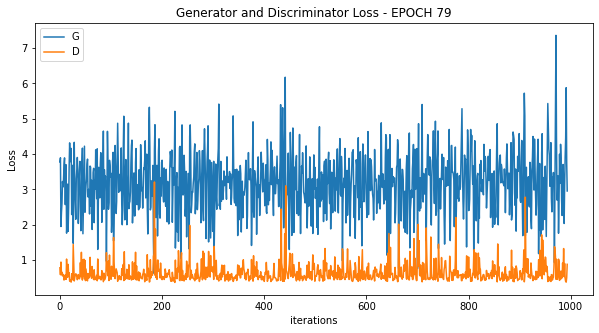

  0%|          | 0/994 [00:00<?, ?it/s]

[81/120][497/994] Loss_D: 0.9895 Loss_G: 3.3695 D(x): 0.9794 D(G(z)): 0.3540 / 0.0332
[81/120][994/994] Loss_D: 1.9007 Loss_G: 1.5573 D(x): 0.1915 D(G(z)): 0.0032 / 0.3008


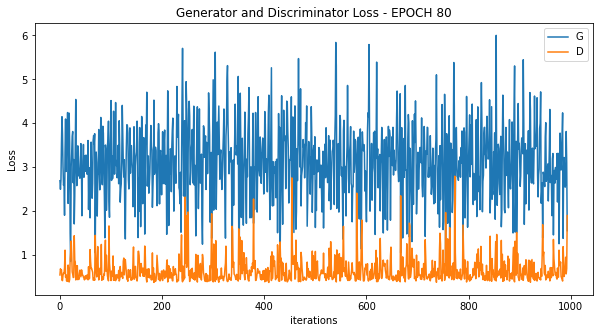

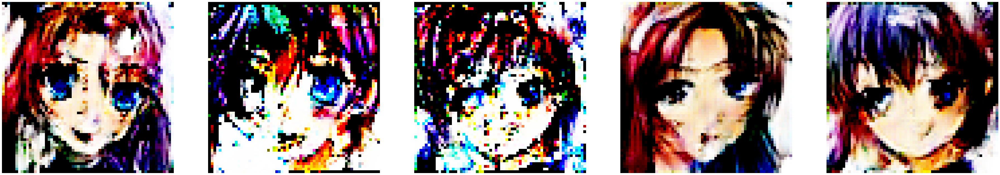

  0%|          | 0/994 [00:00<?, ?it/s]

[82/120][497/994] Loss_D: 0.4240 Loss_G: 5.6537 D(x): 0.9443 D(G(z)): 0.0086 / 0.0033
[82/120][994/994] Loss_D: 1.2793 Loss_G: 5.3366 D(x): 0.9960 D(G(z)): 0.4529 / 0.0040


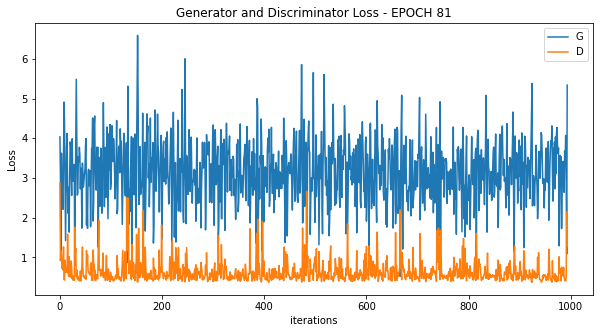

  0%|          | 0/994 [00:00<?, ?it/s]

[83/120][497/994] Loss_D: 0.5150 Loss_G: 2.7126 D(x): 0.8868 D(G(z)): 0.0961 / 0.0719
[83/120][994/994] Loss_D: 1.0710 Loss_G: 4.7911 D(x): 0.6689 D(G(z)): 0.3895 / 0.0064


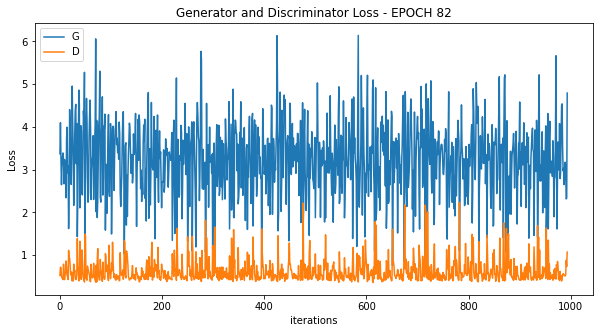

  0%|          | 0/994 [00:00<?, ?it/s]

[84/120][497/994] Loss_D: 0.4895 Loss_G: 4.1447 D(x): 0.8785 D(G(z)): 0.1043 / 0.0174
[84/120][994/994] Loss_D: 0.4812 Loss_G: 4.6138 D(x): 0.7131 D(G(z)): 0.0049 / 0.0073


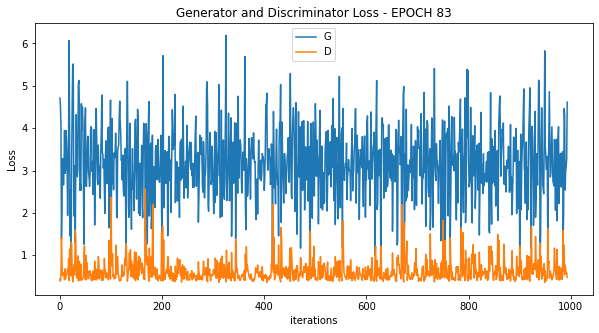

  0%|          | 0/994 [00:00<?, ?it/s]

[85/120][497/994] Loss_D: 1.8283 Loss_G: 0.7164 D(x): 0.1828 D(G(z)): 0.0659 / 0.5553
[85/120][994/994] Loss_D: 0.4328 Loss_G: 3.8069 D(x): 0.9428 D(G(z)): 0.0608 / 0.0189


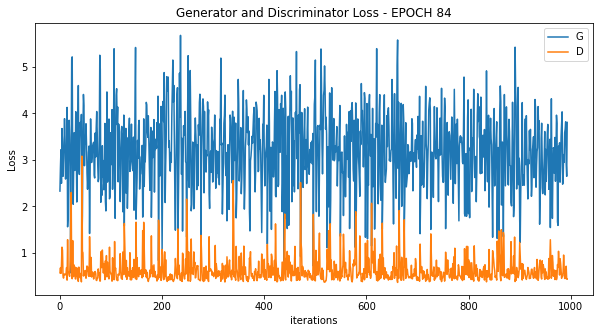

  0%|          | 0/994 [00:00<?, ?it/s]

[86/120][497/994] Loss_D: 0.5438 Loss_G: 3.4448 D(x): 0.7621 D(G(z)): 0.0657 / 0.0339
[86/120][994/994] Loss_D: 0.8234 Loss_G: 4.4392 D(x): 0.9672 D(G(z)): 0.2889 / 0.0081


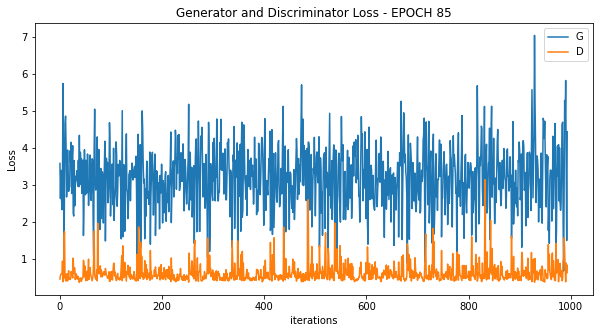

  0%|          | 0/994 [00:00<?, ?it/s]

[87/120][497/994] Loss_D: 0.8757 Loss_G: 3.5703 D(x): 0.4564 D(G(z)): 0.0094 / 0.0296
[87/120][994/994] Loss_D: 2.4780 Loss_G: 4.7449 D(x): 0.3388 D(G(z)): 0.6894 / 0.0072


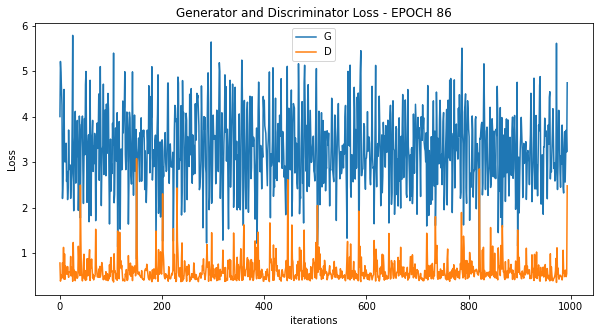

  0%|          | 0/994 [00:00<?, ?it/s]

[88/120][497/994] Loss_D: 0.6341 Loss_G: 3.0054 D(x): 0.9585 D(G(z)): 0.2021 / 0.0500
[88/120][994/994] Loss_D: 0.4540 Loss_G: 4.7163 D(x): 0.9724 D(G(z)): 0.0340 / 0.0077


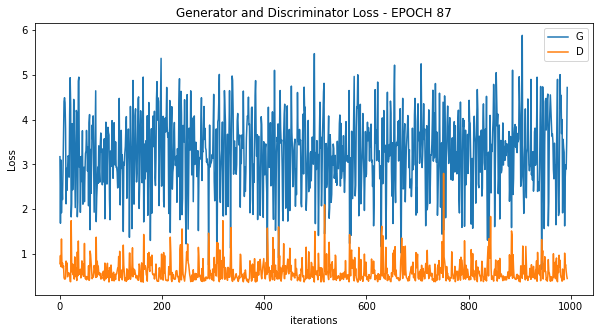

  0%|          | 0/994 [00:00<?, ?it/s]

[89/120][497/994] Loss_D: 0.4125 Loss_G: 4.3046 D(x): 0.7982 D(G(z)): 0.0215 / 0.0133
[89/120][994/994] Loss_D: 0.4479 Loss_G: 5.5956 D(x): 0.9242 D(G(z)): 0.0119 / 0.0028


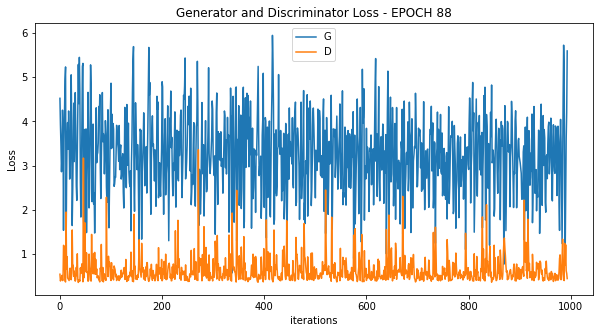

  0%|          | 0/994 [00:00<?, ?it/s]

[90/120][497/994] Loss_D: 0.4245 Loss_G: 3.8768 D(x): 0.7743 D(G(z)): 0.0119 / 0.0196
[90/120][994/994] Loss_D: 1.5495 Loss_G: 0.4876 D(x): 0.2316 D(G(z)): 0.0448 / 0.6816


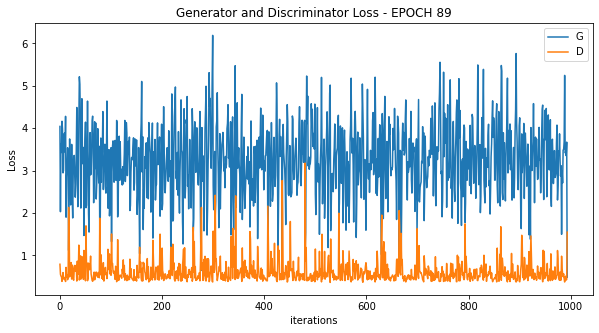

  0%|          | 0/994 [00:00<?, ?it/s]

[91/120][497/994] Loss_D: 0.4415 Loss_G: 4.4466 D(x): 0.9612 D(G(z)): 0.0163 / 0.0095
[91/120][994/994] Loss_D: 0.5988 Loss_G: 3.3463 D(x): 0.9837 D(G(z)): 0.1245 / 0.0357


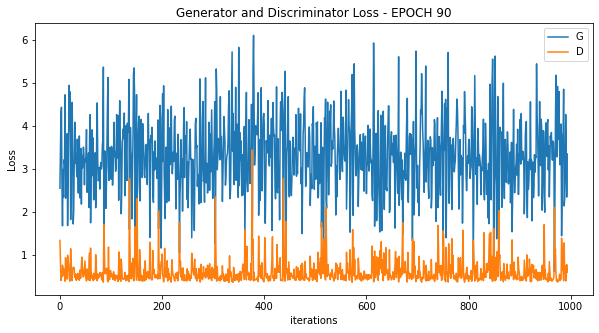

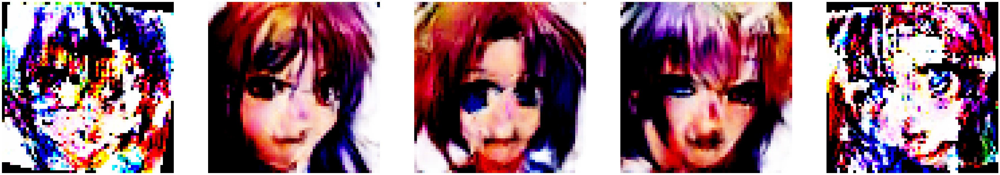

  0%|          | 0/994 [00:00<?, ?it/s]

[92/120][497/994] Loss_D: 0.6621 Loss_G: 3.7040 D(x): 0.9958 D(G(z)): 0.0700 / 0.0241
[92/120][994/994] Loss_D: 1.6478 Loss_G: 2.9207 D(x): 0.1908 D(G(z)): 0.0069 / 0.0746


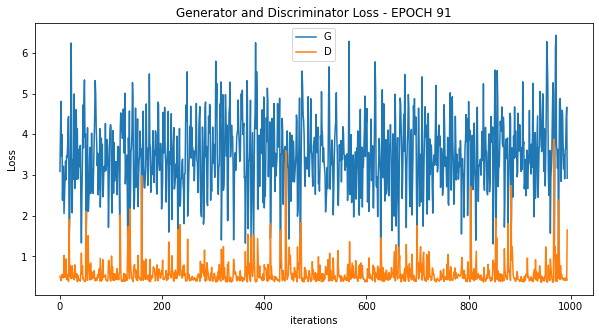

  0%|          | 0/994 [00:00<?, ?it/s]

[93/120][497/994] Loss_D: 0.4826 Loss_G: 2.7630 D(x): 0.9160 D(G(z)): 0.1014 / 0.0587
[93/120][994/994] Loss_D: 0.4315 Loss_G: 3.7572 D(x): 0.9332 D(G(z)): 0.0610 / 0.0243


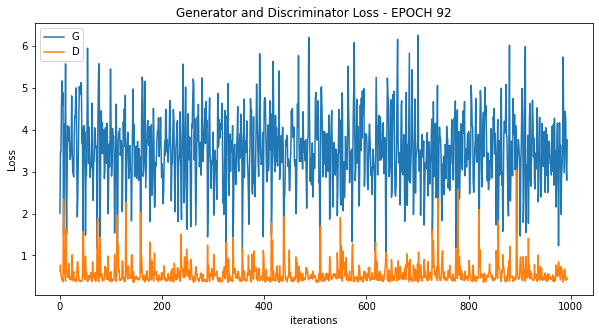

  0%|          | 0/994 [00:00<?, ?it/s]

[94/120][497/994] Loss_D: 1.3275 Loss_G: 1.1173 D(x): 0.3186 D(G(z)): 0.0768 / 0.3821
[94/120][994/994] Loss_D: 0.3841 Loss_G: 8.2270 D(x): 0.8175 D(G(z)): 0.0002 / 0.0002


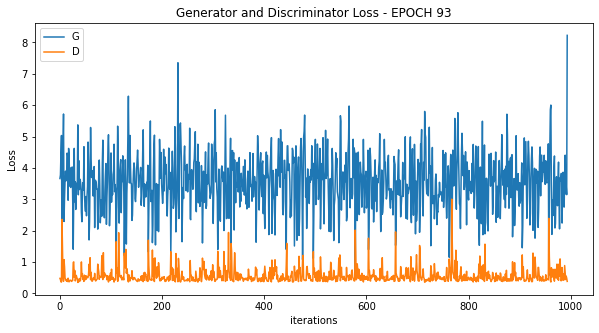

  0%|          | 0/994 [00:00<?, ?it/s]

[95/120][497/994] Loss_D: 0.4139 Loss_G: 3.7981 D(x): 0.9433 D(G(z)): 0.0421 / 0.0235
[95/120][994/994] Loss_D: 0.6622 Loss_G: 3.2777 D(x): 0.6103 D(G(z)): 0.0067 / 0.0380


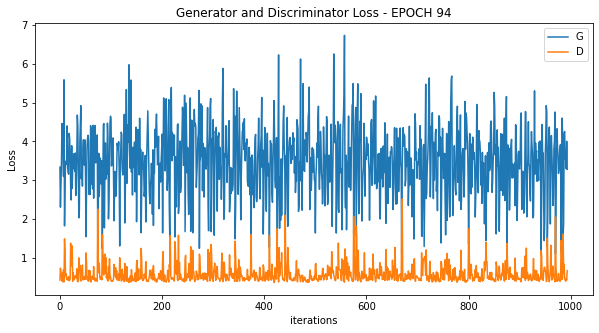

  0%|          | 0/994 [00:00<?, ?it/s]

[96/120][497/994] Loss_D: 1.0240 Loss_G: 2.9154 D(x): 0.9950 D(G(z)): 0.3378 / 0.0543
[96/120][994/994] Loss_D: 2.2876 Loss_G: 1.4399 D(x): 0.1104 D(G(z)): 0.0055 / 0.2821


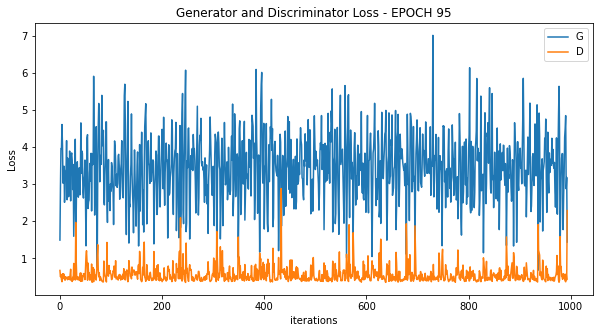

  0%|          | 0/994 [00:00<?, ?it/s]

[97/120][497/994] Loss_D: 0.4535 Loss_G: 2.9493 D(x): 0.7612 D(G(z)): 0.0332 / 0.0581
[97/120][994/994] Loss_D: 0.6127 Loss_G: 3.6979 D(x): 0.9888 D(G(z)): 0.1106 / 0.0199


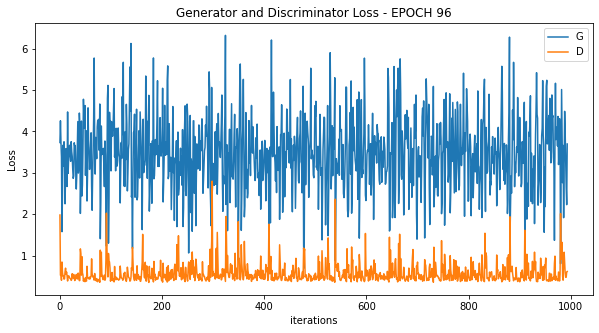

  0%|          | 0/994 [00:00<?, ?it/s]

[98/120][497/994] Loss_D: 0.5278 Loss_G: 3.4336 D(x): 0.7736 D(G(z)): 0.0886 / 0.0282
[98/120][994/994] Loss_D: 3.3156 Loss_G: 2.2461 D(x): 0.0383 D(G(z)): 0.0001 / 0.1126


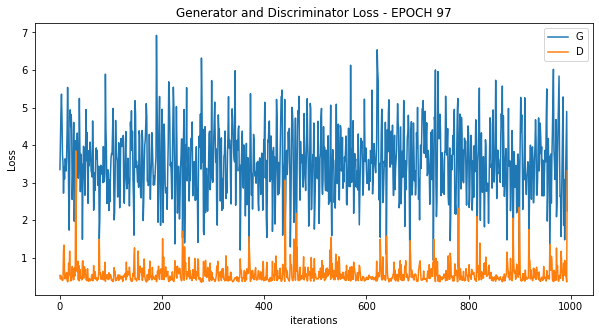

  0%|          | 0/994 [00:00<?, ?it/s]

[99/120][497/994] Loss_D: 0.8755 Loss_G: 2.1953 D(x): 0.4754 D(G(z)): 0.0265 / 0.1230
[99/120][994/994] Loss_D: 0.9909 Loss_G: 1.7479 D(x): 0.4371 D(G(z)): 0.0929 / 0.1762


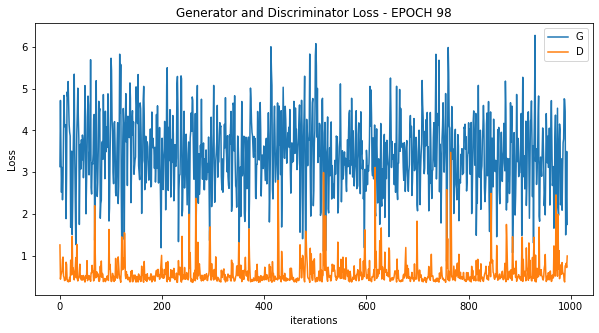

  0%|          | 0/994 [00:00<?, ?it/s]

[100/120][497/994] Loss_D: 0.8182 Loss_G: 2.2643 D(x): 0.4918 D(G(z)): 0.0277 / 0.1090
[100/120][994/994] Loss_D: 0.4010 Loss_G: 3.5601 D(x): 0.9591 D(G(z)): 0.0137 / 0.0249


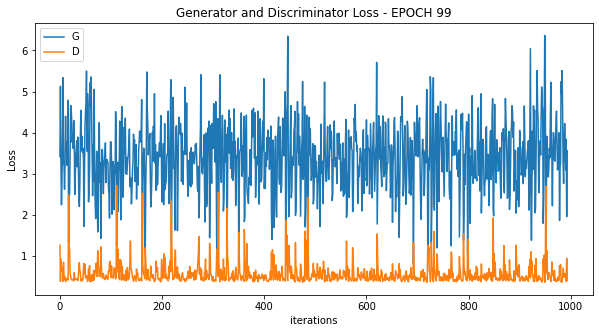

  0%|          | 0/994 [00:00<?, ?it/s]

[101/120][497/994] Loss_D: 0.5263 Loss_G: 3.4244 D(x): 0.9414 D(G(z)): 0.1371 / 0.0273
[101/120][994/994] Loss_D: 2.1059 Loss_G: 0.7975 D(x): 0.1452 D(G(z)): 0.0706 / 0.5012


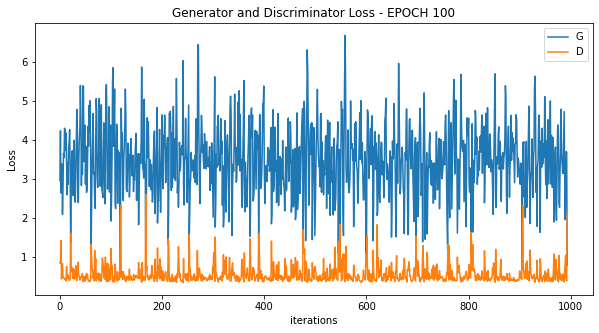

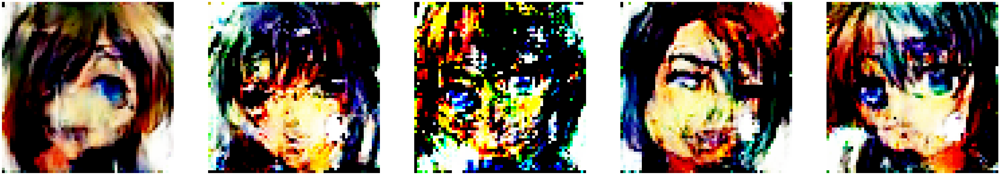

  0%|          | 0/994 [00:00<?, ?it/s]

[102/120][497/994] Loss_D: 0.5100 Loss_G: 5.1694 D(x): 0.9866 D(G(z)): 0.0114 / 0.0049
[102/120][994/994] Loss_D: 1.8833 Loss_G: 3.9485 D(x): 0.1406 D(G(z)): 0.0006 / 0.0253


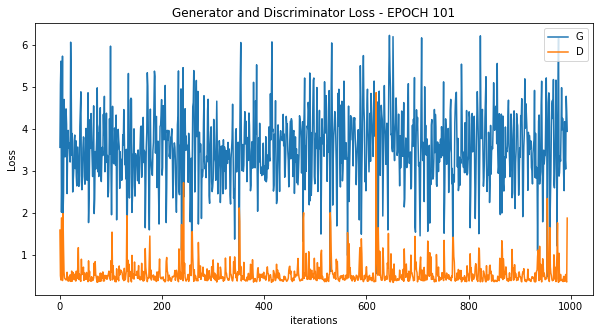

  0%|          | 0/994 [00:00<?, ?it/s]

[103/120][497/994] Loss_D: 0.4932 Loss_G: 4.4462 D(x): 0.9866 D(G(z)): 0.0294 / 0.0096
[103/120][994/994] Loss_D: 0.3716 Loss_G: 3.9252 D(x): 0.8679 D(G(z)): 0.0141 / 0.0179


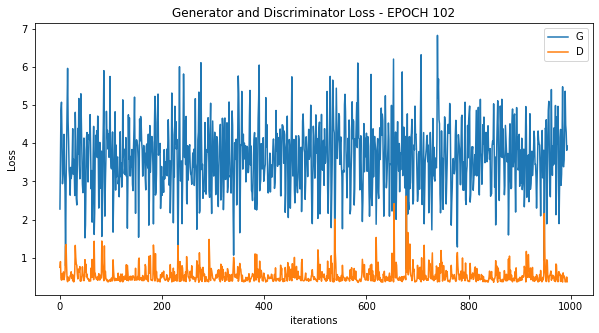

  0%|          | 0/994 [00:00<?, ?it/s]

[104/120][497/994] Loss_D: 0.4779 Loss_G: 1.6220 D(x): 0.8998 D(G(z)): 0.0954 / 0.2057
[104/120][994/994] Loss_D: 0.4621 Loss_G: 5.7949 D(x): 0.9835 D(G(z)): 0.0061 / 0.0035


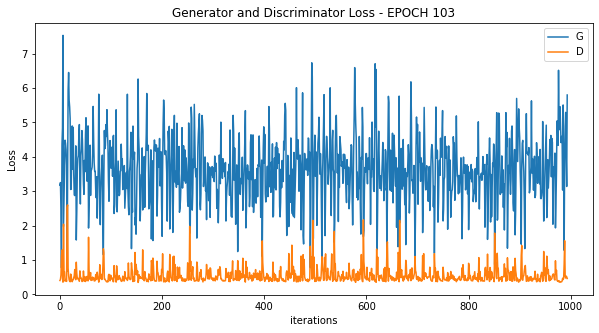

  0%|          | 0/994 [00:00<?, ?it/s]

[105/120][497/994] Loss_D: 0.4160 Loss_G: 3.5787 D(x): 0.9174 D(G(z)): 0.0587 / 0.0251
[105/120][994/994] Loss_D: 0.9441 Loss_G: 2.7235 D(x): 0.4183 D(G(z)): 0.0226 / 0.0787


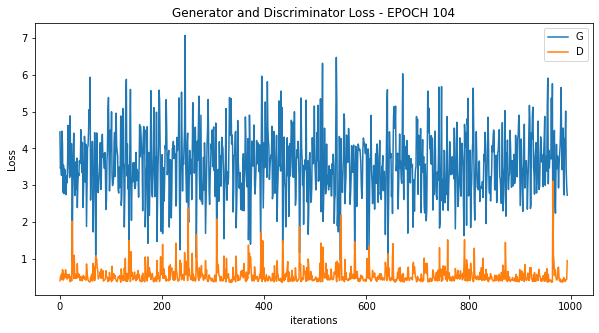

  0%|          | 0/994 [00:00<?, ?it/s]

[106/120][497/994] Loss_D: 0.5340 Loss_G: 3.3304 D(x): 0.8966 D(G(z)): 0.1611 / 0.0317
[106/120][994/994] Loss_D: 0.4494 Loss_G: 5.8102 D(x): 0.9836 D(G(z)): 0.0038 / 0.0021


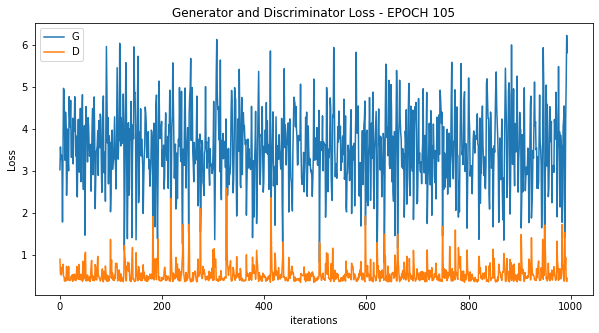

  0%|          | 0/994 [00:00<?, ?it/s]

[107/120][497/994] Loss_D: 0.3998 Loss_G: 5.6043 D(x): 0.7927 D(G(z)): 0.0035 / 0.0036
[107/120][994/994] Loss_D: 1.0410 Loss_G: 0.9766 D(x): 0.4505 D(G(z)): 0.0245 / 0.4212


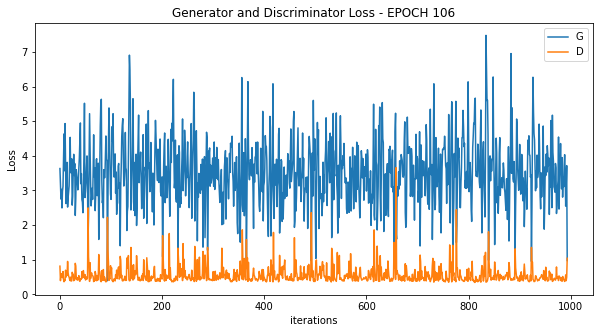

  0%|          | 0/994 [00:00<?, ?it/s]

[108/120][497/994] Loss_D: 1.3839 Loss_G: 4.1786 D(x): 0.7564 D(G(z)): 0.5524 / 0.0160
[108/120][994/994] Loss_D: 1.2712 Loss_G: 1.4516 D(x): 0.3872 D(G(z)): 0.0360 / 0.2288


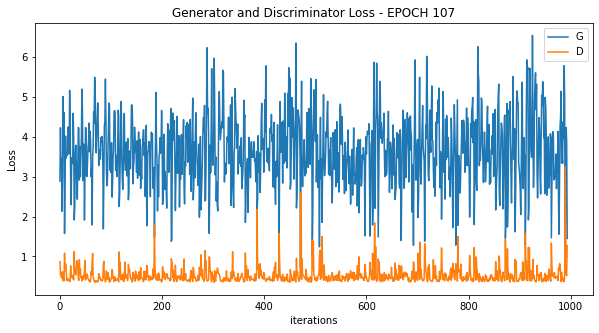

  0%|          | 0/994 [00:00<?, ?it/s]

[109/120][497/994] Loss_D: 0.4936 Loss_G: 2.8982 D(x): 0.7528 D(G(z)): 0.0537 / 0.0511
[109/120][994/994] Loss_D: 1.6138 Loss_G: 1.1149 D(x): 0.2870 D(G(z)): 0.0465 / 0.4851


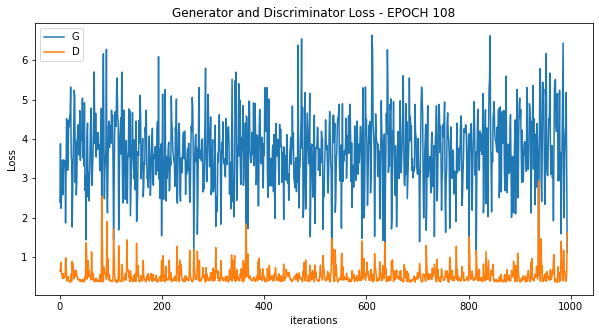

  0%|          | 0/994 [00:00<?, ?it/s]

[110/120][497/994] Loss_D: 0.6346 Loss_G: 2.5480 D(x): 0.9736 D(G(z)): 0.1883 / 0.0709
[110/120][994/994] Loss_D: 0.4552 Loss_G: 3.0149 D(x): 0.7394 D(G(z)): 0.0300 / 0.0482


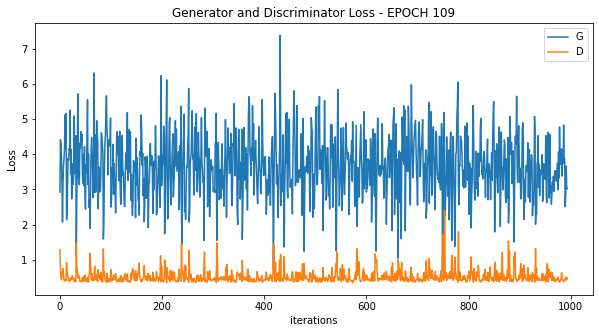

  0%|          | 0/994 [00:00<?, ?it/s]

[111/120][497/994] Loss_D: 0.3850 Loss_G: 5.7997 D(x): 0.9492 D(G(z)): 0.0079 / 0.0024
[111/120][994/994] Loss_D: 0.3653 Loss_G: 6.7659 D(x): 0.9369 D(G(z)): 0.0013 / 0.0007


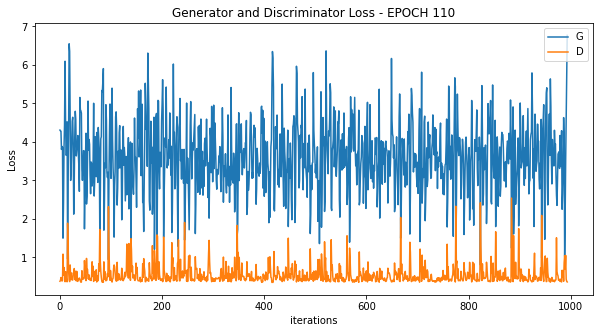

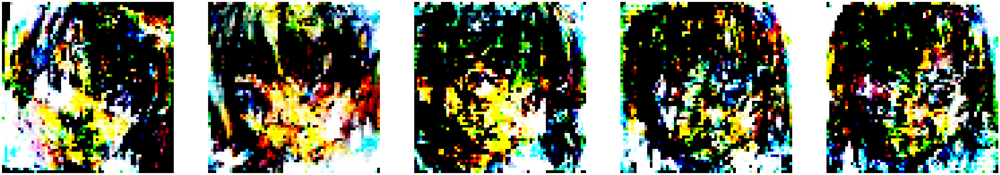

  0%|          | 0/994 [00:00<?, ?it/s]

[112/120][497/994] Loss_D: 0.3969 Loss_G: 5.3512 D(x): 0.9251 D(G(z)): 0.0272 / 0.0055
[112/120][994/994] Loss_D: 2.2360 Loss_G: 0.4793 D(x): 0.1769 D(G(z)): 0.1942 / 0.7588


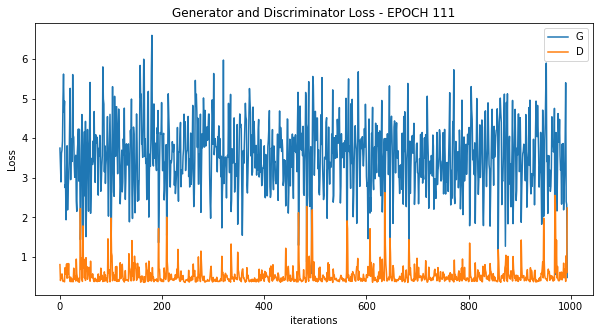

  0%|          | 0/994 [00:00<?, ?it/s]

[113/120][497/994] Loss_D: 0.5639 Loss_G: 4.3678 D(x): 0.9796 D(G(z)): 0.0914 / 0.0101
[113/120][994/994] Loss_D: 0.6552 Loss_G: 2.5663 D(x): 0.9862 D(G(z)): 0.1076 / 0.0651


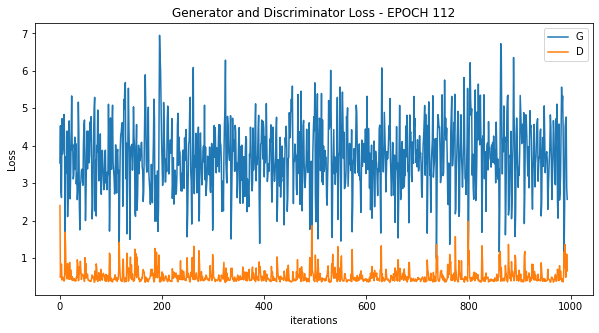

  0%|          | 0/994 [00:00<?, ?it/s]

[114/120][497/994] Loss_D: 0.6215 Loss_G: 2.6017 D(x): 0.6798 D(G(z)): 0.0780 / 0.0936
[114/120][994/994] Loss_D: 0.4489 Loss_G: 3.4552 D(x): 0.7765 D(G(z)): 0.0300 / 0.0272


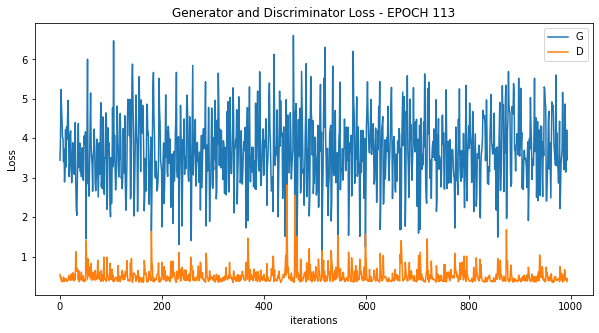

  0%|          | 0/994 [00:00<?, ?it/s]

[115/120][497/994] Loss_D: 0.4364 Loss_G: 3.6193 D(x): 0.8151 D(G(z)): 0.0488 / 0.0240
[115/120][994/994] Loss_D: 0.3979 Loss_G: 3.9082 D(x): 0.7848 D(G(z)): 0.0162 / 0.0179


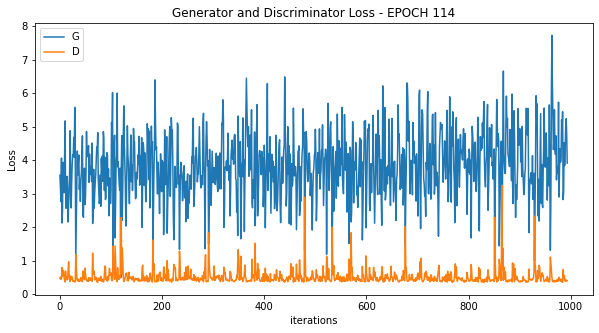

  0%|          | 0/994 [00:00<?, ?it/s]

[116/120][497/994] Loss_D: 0.5420 Loss_G: 2.5746 D(x): 0.7232 D(G(z)): 0.0923 / 0.0716
[116/120][994/994] Loss_D: 0.3820 Loss_G: 4.8755 D(x): 0.9195 D(G(z)): 0.0180 / 0.0089


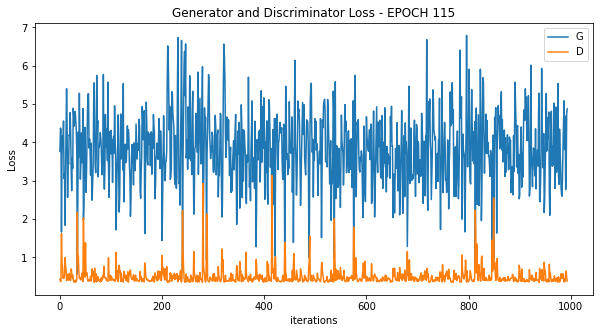

  0%|          | 0/994 [00:00<?, ?it/s]

[117/120][497/994] Loss_D: 0.4228 Loss_G: 4.1186 D(x): 0.9404 D(G(z)): 0.0558 / 0.0185
[117/120][994/994] Loss_D: 2.2389 Loss_G: 2.7088 D(x): 0.1260 D(G(z)): 0.0075 / 0.0792


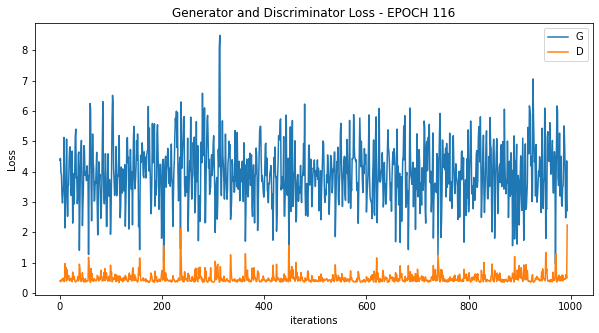

  0%|          | 0/994 [00:00<?, ?it/s]

[118/120][497/994] Loss_D: 0.4175 Loss_G: 3.4289 D(x): 0.7953 D(G(z)): 0.0289 / 0.0295
[118/120][994/994] Loss_D: 0.5533 Loss_G: 6.1287 D(x): 0.9950 D(G(z)): 0.0085 / 0.0022


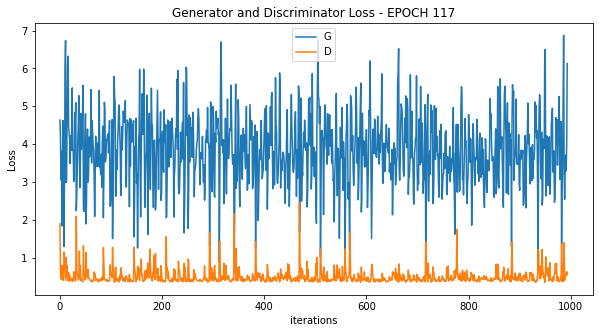

  0%|          | 0/994 [00:00<?, ?it/s]

[119/120][497/994] Loss_D: 0.3967 Loss_G: 4.2598 D(x): 0.9020 D(G(z)): 0.0217 / 0.0125
[119/120][994/994] Loss_D: 0.4002 Loss_G: 6.4372 D(x): 0.9585 D(G(z)): 0.0019 / 0.0014


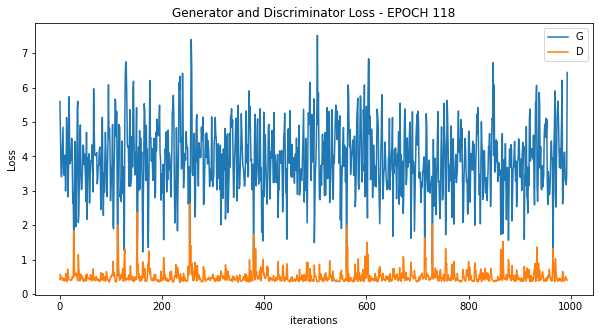

  0%|          | 0/994 [00:00<?, ?it/s]

[120/120][497/994] Loss_D: 0.4073 Loss_G: 4.3800 D(x): 0.9386 D(G(z)): 0.0484 / 0.0103
[120/120][994/994] Loss_D: 0.3791 Loss_G: 4.5744 D(x): 0.9437 D(G(z)): 0.0204 / 0.0078


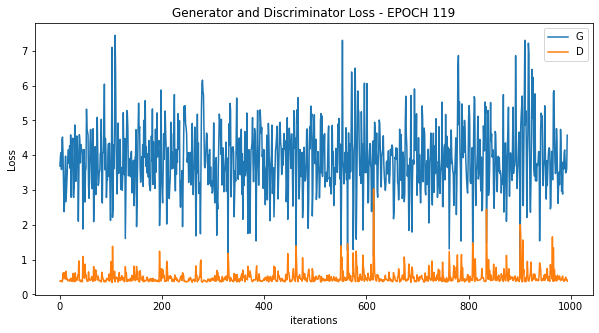

In [12]:
for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)

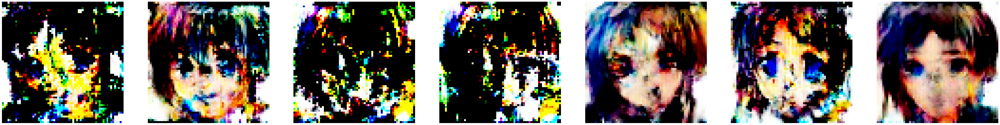

In [13]:
show_generated_img(7)

In [14]:
if not os.path.exists('/kaggle/working/output_images'):
    os.mkdir('/kaggle/working/output_images')

In [15]:
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('/kaggle/working/output_images', f'image_{i_batch+i_image:05d}.png'))

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


  0%|          | 0/200 [00:00<?, ?it/s]

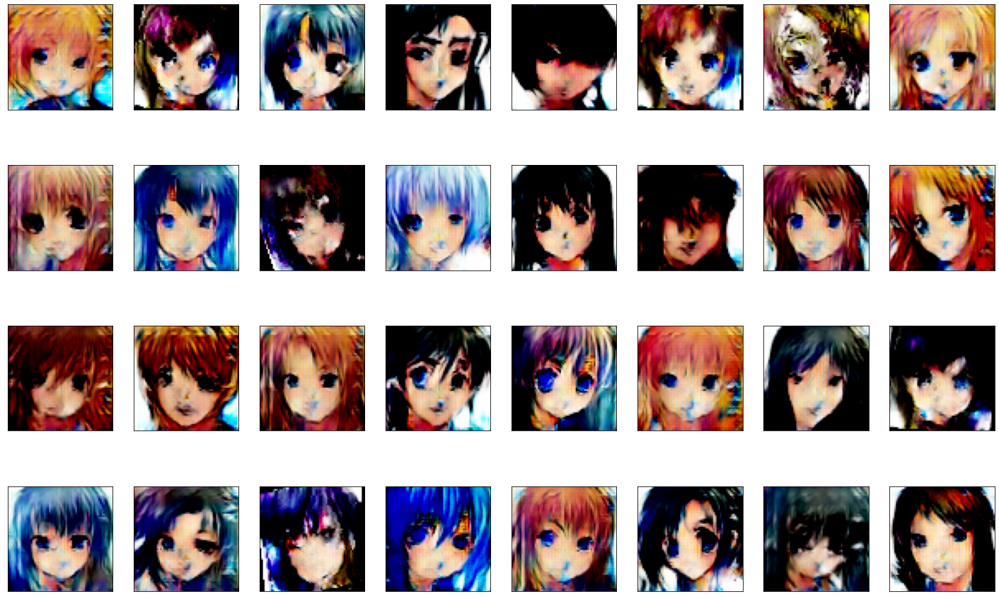

In [16]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)